# **COMMON FX & SAVED**

### **Install**

In [64]:
!pip install boruta


[notice] A new release of pip is available: 24.1.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [65]:
pip install gplearn

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: gplearn in c:\users\user\appdata\local\programs\python\python312\lib\site-packages (0.4.2)




[notice] A new release of pip is available: 24.1.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [66]:
pip install pygam

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [67]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### **Imports**

In [ ]:
# Data Manipulation
import pandas as pd
import numpy as np

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import ipywidgets as widgets
from IPython.display import display, clear_output
import seaborn as sns

# Machine Learning Libraries
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, KFold
from sklearn.linear_model import (LinearRegression, LogisticRegression, Ridge, LassoCV)
from sklearn.ensemble import (RandomForestRegressor, GradientBoostingRegressor, StackingRegressor)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import (mean_squared_error, mean_absolute_error, r2_score, root_mean_squared_error)
from xgboost import XGBRegressor
from gplearn.genetic import SymbolicRegressor
from pygam import LinearGAM, s
from sklearn.feature_selection import RFE, VarianceThreshold, SelectKBest, f_classif
from sklearn.preprocessing import (LabelEncoder, StandardScaler, RobustScaler, MinMaxScaler)
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.kernel_ridge import KernelRidge
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
import skfuzzy as fuzz
from skfuzzy import cluster
import keras_tuner as kt
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense
from tensorflow.keras import backend as K
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from boruta import BorutaPy

# Statistical Libraries
from scipy.stats import (spearmanr, kruskal, mannwhitneyu, johnsonsu, gaussian_kde)
import statsmodels.api as sm

# Deep Learning Libraries
import torch
import torch.nn as nn
import torch.optim as optim
from keras.models import Sequential
from keras.layers import SimpleRNN, LSTM, Conv1D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

# Genetic Algorithms
from deap import base, creator, tools, algorithms


# Parallel Processing and saving variables
from joblib import parallel_backend, dump, load
import json

# itertools for Combinations
from itertools import combinations

# Additional Libraries
from collections import Counter
import random
import math

### **Important FX**

In [69]:
# Function to calculate MASE
def calculate_mase(y_true, y_pred):
    # Convert Series to numpy arrays if necessary
    y_true_array = y_true.to_numpy() if isinstance(y_true, pd.Series) else y_true
    y_pred_array = y_pred.to_numpy() if isinstance(y_pred, pd.Series) else y_pred

    # Calculate MAE of the naive forecast
    naive_forecast_error = np.mean(np.abs(np.diff(y_true_array)))
    mase = np.mean(np.abs(y_true_array - y_pred_array)) / naive_forecast_error
    
    return mase

# Function to calculate NRMSE
def calculate_nrmse(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    nrmse = rmse / (np.max(y_true) - np.min(y_true))
    return rmse, nrmse

# Update the acc function to include MASE
def acc(y_pred, y_test, target=None):
    from sklearn.metrics import r2_score, mean_absolute_error
    import numpy as np

    # If a target is provided, use that specific column, otherwise use y_test directly
    if target is not None:
        y_test_target = y_test[target]
    else:
        y_test_target = y_test

    # NRMSE calculation
    rmse, nrmse = calculate_nrmse(y_test_target, y_pred)

    # R-squared calculation
    r2 = r2_score(y_test_target, y_pred)
    
    # MAE calculation
    mae = mean_absolute_error(y_test_target, y_pred)

    # MASE calculation
    mase = calculate_mase(y_test_target, y_pred)

    return nrmse, rmse, r2, mae, mase

# Update the train function to use the new metrics including MASE
def train(model, X_train, y_train, X_test, y_test, model_name = '', targets=['BABY', 'JUVENILE', 'ADULT'], patience=10, earlystop = True, epochs = 200):
    # Define the early stopping callback with penalty
    early_stopping = EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True)
    
    # Initialize dictionary to store predictions for each target
    y_pred_dict = {}
    results = {}  # Initialize results dictionary to store metrics
    
    # Fit the model with multi-output targets
    if model_name in ["RNN", "LSTM", "CNN", "DNN"]:
        if earlystop:
            # Fit the model for RNN, LSTM, CNN, DNN
            history = model.fit(
                X_train, [y_train[targets[0]], y_train[targets[1]], y_train[targets[2]]], 
                epochs=epochs,
                validation_data=(X_test, [y_test[targets[0]], y_test[targets[1]], y_test[targets[2]]]),
                callbacks=[early_stopping]
                )
        else:
            if model_name in ["RNN", "LSTM", "CNN", "DNN"]:
                # Fit the model for RNN, LSTM, CNN, DNN
                history = model.fit(
                    X_train, [y_train[targets[0]], y_train[targets[1]], y_train[targets[2]]], 
                    epochs=epochs,
                    validation_data=(X_test, [y_test[targets[0]], y_test[targets[1]], y_test[targets[2]]])
                    )
            
        # Make predictions for the current target
        y_pred = model.predict(X_test)

        for target in targets:
            # Save the predictions in the dictionary
            y_pred_dict[target] = y_pred

            # Compute metrics
            nrmse, rmse, r2, mae, mase = acc(y_pred, y_test[target])

            # Store the results for comparison
            results[target] = {
                'NRMSE': nrmse, 
                'RMSE': rmse, 
                'R2': r2,
                'MAE': mae,
                'MASE': mase,
            }

            # Print results
            print(f'{target}: NRMSE: {nrmse:.4f}, RMSE: {rmse:.2f}, R2: {r2:.4f}, MAE: {mae:.2f}, MASE: {mase:.4f}')

    else:
        if model_name in ['GAM']:
            for target in targets:
                # For other models, simply fit the model on multi-output target data
                history = model.fit(X_train, y_train[target])

                y_pred_target = model.predict(X_test)

                # Store the predictions for this target in the dictionary
                y_pred_dict[target] = y_pred_target

                # Compute accuracy metrics for each target
                nrmse, rmse, r2, mae, mase = acc(y_pred_target, y_test[target])

                # Store the results
                results[target] = {
                    'NRMSE': nrmse,
                    'RMSE': rmse,
                    'R2': r2,
                    'MAE': mae,
                    'MASE': mase,
                }

                # Print the results
                print(f'{target}: NRMSE: {nrmse:.4f}, RMSE: {rmse:.2f}, R2: {r2:.4f}, MAE: {mae:.2f}, MASE: {mase:.4f}')
                
        else:
            # For other models, simply fit the model on multi-output target data
            history = model.fit(X_train, y_train)

            y_pred_all = model.predict(X_test)

            # Compute metrics for each target separately
            for i, target in enumerate(['BABY', 'JUVENILE', 'ADULT']):
                # Extract predictions for each target from the multi-output predictions
                y_pred_target = y_pred_all[:, i]

                # Store the predictions for this target in the dictionary
                y_pred_dict[target] = y_pred_target

                # Compute accuracy metrics for each target
                nrmse, rmse, r2, mae, mase = acc(y_pred_target, y_test[target])

                # Store the results
                results[target] = {
                    'NRMSE': nrmse,
                    'RMSE': rmse,
                    'R2': r2,
                    'MAE': mae,
                    'MASE': mase,
                }

                # Print the results
                print(f'{target}: NRMSE: {nrmse:.4f}, RMSE: {rmse:.2f}, R2: {r2:.4f}, MAE: {mae:.2f}, MASE: {mase:.4f}')

    return y_pred_dict, results, history

# Update the compare_models function to include MASE in metrics_to_compare
def compare_models(model_results, topnum, metrics_to_compare=None):
    if metrics_to_compare is None:
        metrics_to_compare = ['NRMSE', 'RMSE', 'R2', 'MAE', 'MASE']
    
    best_models = {}

    # Initialize best scores for each target
    for target in model_results[next(iter(model_results))]:
        best_models[target] = {
            metric: {'model': None, 'value': float('inf')} if metric != 'R2' else {'model': None, 'value': -float('inf')}
            for metric in metrics_to_compare
        }

    # Compare the results for each model and each target
    for model_name, results in model_results.items():
        for target, metrics_values in results.items():
            for metric, value in metrics_values.items():
                if metric in metrics_to_compare:
                    if metric != 'R2':
                        if value < best_models[target][metric]['value']:
                            best_models[target][metric] = {'model': model_name, 'value': value}
                    else:
                        if value > best_models[target][metric]['value']:
                            best_models[target][metric] = {'model': model_name, 'value': value}

    # Calculate average metrics for each model
    avg_metrics = {}
    for model_name, results in model_results.items():
        avg_metrics[model_name] = {
            metric: np.mean([results[target][metric] for target in results if metric in results[target]])
            for metric in metrics_to_compare
        }

    # Sort models based on average metrics
    sorted_models = {}
    for metric in metrics_to_compare:
        sorted_models[metric] = sorted(avg_metrics.items(), key=lambda x: x[1][metric], reverse=(metric == 'R2'))[:topnum]

    # Display results for each metric
    for metric in metrics_to_compare:
        order = "descending" if metric == 'R2' else "ascending"
        print(f"\nTop {topnum} Models Based on Average {metric} (sorted in {order} order):")
        for i, (model_name, metrics) in enumerate(sorted_models[metric], 1):
            print(f"  {i}. Model: {model_name}, Average {metric}: {np.round(metrics[metric], 4)}")

    return best_models, sorted_models

def remove_estimator__(best_params):
    # Create a new dictionary with cleaned keys
    cleaned_params = {key.replace('estimator__', ''): value for key, value in best_params.items()}
    return cleaned_params

def reshape_for_rnn_cnn(X, model_type="rnn"):
    # Convert to NumPy array if X is a DataFrame
    X_array = X.to_numpy() if hasattr(X, 'to_numpy') else X

    if model_type.lower() == "cnn":
        # For CNN, shape should be (samples, time_steps, features)
        return X_array.reshape((X_array.shape[0], X_array.shape[1], 1))
    elif model_type.lower() in ["rnn", "lstm"]:
        # For RNN/LSTM, shape should be (samples, time_steps, features)
        return X_array.reshape((X_array.shape[0], 1, X_array.shape[1]))
    else:
        raise ValueError("Invalid model_type. Choose either 'rnn', 'lstm', or 'cnn'.")


### **Visuals FX**

In [214]:
def vis_result_individual(model_dict, y_test, selected_target, selected_metric, combined_results):
    dot_size = 5  # Fixed dot size
    textspace = 0.03
    fontsize = 12

    # Dictionary to store average values for each metric by model
    avg_metric = {model_name: [] for model_name in model_dict}
    avg_r2 = {model_name: [] for model_name in model_dict}

    # Compute average if "Average" is selected
    if selected_target == "Average":
        y_true = y_test[['BABY', 'JUVENILE', 'ADULT']].mean(axis=1).values
    else:
        y_true = y_test[selected_target].values  # Actual values for the selected target

    num_models = len(model_dict)
    cols = 3
    max_plots_per_page = 15
    rows = math.ceil(min(num_models, max_plots_per_page) / cols)
    total_pages = math.ceil(num_models / max_plots_per_page)

    # Loop through each page of models
    for page in range(total_pages):
        # Determine start and end indices for the current page of models
        start_idx = page * max_plots_per_page
        end_idx = min(start_idx + max_plots_per_page, num_models)
        models_to_plot = list(model_dict.items())[start_idx:end_idx]
        
        # Create the figure for the current page
        fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 6 * rows))
        axes = axes.flatten()  # Flatten to make it easier to index

        # Loop through each model in the current page and plot
        for i, (model_name, y_pred_dict) in enumerate(models_to_plot):
            ax = axes[i]

            # Compute average predictions if "Average" is selected
            if selected_target == "Average":
                y_pred = np.array([y_pred_dict[col] for col in ['BABY', 'JUVENILE', 'ADULT']]).mean(axis=0)
                metrics = {metric: np.mean([combined_results[model_name][col][metric] 
                                            for col in ['BABY', 'JUVENILE', 'ADULT']]) 
                           for metric in combined_results[model_name]['BABY']}
            else:
                y_pred = np.array(y_pred_dict[selected_target])
                metrics = combined_results[model_name][selected_target]

            avg_metric[model_name].append(metrics.get(selected_metric, 0))
            avg_r2[model_name].append(metrics.get('R2', 0))

            # Check if NRMSE > 0.3 or R² < 0.7
            line_color = '#03572a'
            if selected_metric == 'NRMSE' and metrics.get('NRMSE', 0) > 0.3:
                line_color = 'red'
            elif selected_metric == 'R2' and metrics.get('R2', 0) < 0.7:
                line_color = 'red'

            # Fit a linear regression model for the current model's predictions
            lr_model = LinearRegression().fit(y_true.reshape(-1, 1), y_pred)
            y_pred_line = lr_model.predict(y_true.reshape(-1, 1))

            # Plot the predictions as a scatter plot and regression line
            ax.scatter(y_true, y_pred, s=dot_size, color=line_color, alpha=0.6, label='Scatter')
            ax.plot(y_true, y_pred_line, linestyle='-', color=line_color,
                    label=f'Regression Line ({selected_metric} = {metrics.get(selected_metric, 0):.2f}, R² = {metrics.get("R2", 0):.2f})')

            # Annotate all metrics on top of the graph
            metric_text = "\n".join([f"{metric}: {value:.4f}" for metric, value in metrics.items()])
            ax.annotate(metric_text, xy=(0.05, 0.95 - textspace), 
                        xycoords='axes fraction', fontsize=fontsize, fontweight='bold', color='black', verticalalignment='top')

            # Line of perfect prediction
            line = np.linspace(np.min(y_true), np.max(y_true), 100)
            ax.plot(line, line, color='grey', linestyle='--', label='Perfect Prediction')

            # Set titles and labels for each subplot
            ax.set_title(f'{model_name} for {selected_target}')
            ax.set_xlabel('Actual Values')
            ax.set_ylabel('Predicted Values')
            ax.grid()
            
            # Add legend to the bottom right of the current subplot
            ax.legend(loc='lower right')

        # Hide unused axes if fewer than max plots
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)

        # Adjust layout for the current page
        plt.tight_layout()
        plt.show()

    
def filter_reg(models_list, y_test, predictions, list_results):    
    # Create checkboxes
    checkboxes = [widgets.Checkbox(value=False, description=model) for model in models_list]

    # Create a dropdown for metric selection
    metric_dropdown = widgets.Dropdown(
        options=['NRMSE', 'RMSE', 'MAE', 'MASE'],
        value='NRMSE',
        description='Metric:',
    )
    
    # Define a dropdown for target selection
    target_dropdown = widgets.Dropdown(
        options=['BABY', 'JUVENILE', 'ADULT', 'Average'],
        value='Average',
        description='Target:',
    )
    
    # Function to update visualization based on selected models and metric
    def update_visualization(selected_models, list_results):
        clear_output(wait=True)  # Clear previous output
        display(container)  # Re-display the main container with all widgets
        
        if not selected_models:
            print("No model selected!")
            return
        
        # Get the selected metric
        selected_metric = metric_dropdown.value
        selected_target = target_dropdown.value
        # Prepare and visualize results for selected models
        model_dict = {model: predictions.get(model) for model in selected_models}
        
        print(f"Visualizing results for: {selected_models} using metric: {selected_metric}")
        vis_result_individual(model_dict, y_test, selected_target, selected_metric, list_results)

    # Create the checkbox columns (max 5 checkboxes per column)
    max_checkboxes_per_column = 20
    checkbox_columns = []

    # Split checkboxes into groups
    for i in range(0, len(checkboxes), max_checkboxes_per_column):
        column = widgets.VBox(checkboxes[i:i + max_checkboxes_per_column])
        checkbox_columns.append(column)

    # Define the layout for checkboxes
    checkbox_container = widgets.HBox(checkbox_columns)

    # Display the checkboxes and button initially
    button = widgets.Button(description="Show Results")
    select_all_button = widgets.Button(description="Select All")
    select_smote_button = widgets.Button(description="Select SMOTE")
    select_bootstrap_button = widgets.Button(description="Select Bootstrap")
    select_original_button = widgets.Button(description="Select Original")
    select_ann_button = widgets.Button(description="Select All ANN")
    select_synthetic_button = widgets.Button(description="Select All Synthetic Data")

    # Create horizontal buttons for model types
    model_selection_buttons = widgets.HBox([
        widgets.Button(description="Select Random Forest"),
        widgets.Button(description="Select Decision Trees"),
        widgets.Button(description="Select GBM"),
        widgets.Button(description="Select XGBoost"),
        widgets.Button(description="Select Stacking")
    ])

    # Define button click events for various actions
    def on_button_click(b):
        selected_models = [checkbox.description for checkbox in checkboxes if checkbox.value]
        print("Selected models:", selected_models)
        update_visualization(selected_models, list_results)

    def toggle_select_all(b):
        if all(checkbox.value for checkbox in checkboxes):
            for checkbox in checkboxes:
                checkbox.value = False
        else:
            for checkbox in checkboxes:
                checkbox.value = True

    def select_smote(b):
        for checkbox in checkboxes:
            checkbox.value = "SMOTE" in checkbox.description

    def select_bootstrap(b):
        for checkbox in checkboxes:
            checkbox.value = "bootstrap" in checkbox.description

    def select_original(b):
        for checkbox in checkboxes:
            checkbox.value = not any(synthetic in checkbox.description for synthetic in ["SMOTE", "bootstrap", "diffusion net", "MFDTE", "GA", "MTD", "SJDT"])

    def select_rf(b):
        for checkbox in checkboxes:
            checkbox.value = "Random Forest" in checkbox.description

    def select_dt(b):
        for checkbox in checkboxes:
            checkbox.value = "Decision Tree" in checkbox.description

    def select_gbm(b):
        for checkbox in checkboxes:
            checkbox.value = "GBM" in checkbox.description

    def select_xgboost(b):
        for checkbox in checkboxes:
            checkbox.value = "XGBoost" in checkbox.description

    def select_stacking(b):
        for checkbox in checkboxes:
            checkbox.value = "Stacking" in checkbox.description

    def select_ann(b):
        for checkbox in checkboxes:
            checkbox.value = any(synthetic in checkbox.description for synthetic in ['ANN', 'RNN', 'LSTM', 'DNN', 'CNN'])

    def select_synthetic(b):
        for checkbox in checkboxes:
            checkbox.value = any(synthetic in checkbox.description for synthetic in ["SMOTE", "bootstrap", "diffusion net", "MFDTE", "GA", "MTD", "SJDT"])

    # Assign button click events
    select_all_button.on_click(toggle_select_all)
    select_smote_button.on_click(select_smote)
    select_bootstrap_button.on_click(select_bootstrap)
    select_original_button.on_click(select_original)
    select_ann_button.on_click(select_ann)
    select_synthetic_button.on_click(select_synthetic)
    model_selection_buttons.children[0].on_click(select_rf)  # Random Forest
    model_selection_buttons.children[1].on_click(select_dt)  # Decision Trees
    model_selection_buttons.children[2].on_click(select_gbm)  # GBM
    model_selection_buttons.children[3].on_click(select_xgboost)  # XGBoost
    model_selection_buttons.children[4].on_click(select_stacking)  # Stacking
    button.on_click(on_button_click)

    # Arrange everything in an HBox for side-by-side display
    button_container = widgets.HBox([
        select_all_button,
        select_smote_button,
        select_bootstrap_button,
        select_original_button,
        select_ann_button,
        select_synthetic_button
    ])

    # Create a main container to hold everything
    container = widgets.VBox([
        metric_dropdown,         # Metric dropdown at the top
        target_dropdown,
        checkbox_container,      # Checkboxes in columns
        model_selection_buttons, # Model selection buttons in horizontal layout
        button_container,        # Action buttons below checkboxes
        button                   # Show results button below the action buttons
    ])

    # Display the initial layout
    display(container)

    
a = 0
def bar_vis(list_results):
    # Initialize the Dash app
    app = dash.Dash(__name__)

    def vis_bar(selected_model_results, metric, selected_models):
        # Prepare data for plotting
        average_metrics = [
            (model, np.mean([data[metric] for data in model_data.values()]))
            for model, model_data in selected_model_results.items()
            if model in selected_models  # Filter based on selected models
        ]

        # Sort by the selected metric
        reverse_sort = True if metric in ['NRMSE', 'RMSE', 'MAE', 'MASE'] else False
        average_metrics.sort(key=lambda x: x[1], reverse=reverse_sort)

        # Extract sorted data
        sorted_models = [item[0] for item in average_metrics]
        sorted_average_metrics = [item[1] for item in average_metrics]

        # Set bar color based on the metric
        bar_color = 'salmon' if metric in ['NRMSE', 'RMSE', 'MAE', 'MASE'] else 'lightgreen'

        fig = go.Figure()

        # Add bars with text displaying values at the end of each bar
        fig.add_trace(go.Bar(
            x=sorted_average_metrics,
            y=sorted_models,
            orientation='h',
            marker_color=bar_color,
            text=sorted_average_metrics,  # Show values at the end of each bar
            texttemplate='%{text:.4f}',
            textposition='inside'  # Position text outside the bars
        ))

        # Update layout
        fig.update_layout(
            title=f"Average {metric.upper()} for Selected Models",
            xaxis_title=metric.upper(),
            yaxis_title="",
            height=2000,
            width=1200,  # Increased width for better visibility
            showlegend=False,  # Remove the legend
            margin=dict(l=250, r=20, t=50, b=50),  # Adjust margins for better fitting
            yaxis_tickangle=0,  # Rotate y-axis labels for better visibility
        )

        return fig

    # App layout
    app.layout = html.Div([
        # Main container for the graph and controls
        html.Div(
            style={'display': 'flex', 'flex-direction': 'row', 'backgroundColor': 'white'},
            children=[
                dcc.Graph(id='bar-chart', style={'flex': '1', 'backgroundColor': 'white'}),
                
                # Filters and buttons on the right side with white background
                html.Div(
                    style={
                        'display': 'flex', 
                        'flex-direction': 'column', 
                        'align-items': 'flex-end', 
                        'margin-left': '20px',
                        'backgroundColor': 'white',
                        'padding': '10px',
                        'border': '1px solid #ddd',  # Optional: border for better visibility
                        'height': '600px',  # Set height to enable scrolling
                        'overflowY': 'auto'  # Enable vertical scrolling
                    },
                    children=[
                        dcc.Dropdown(
                            id='model-dropdown',
                            options=[{'label': key, 'value': key} for key in list_results.keys()],
                            value='Best Initial Model',  # Default to the first option
                            style={'width': '200px', 'margin-bottom': '10px'}
                        ),
                        dcc.Dropdown(
                            id='metric-dropdown',
                            options=[
                                {'label': 'NRMSE', 'value': 'NRMSE'},
                                {'label': 'RMSE', 'value': 'RMSE'},
                                {'label': 'R²', 'value': 'R2'},
                                {'label': 'MAE', 'value': 'MAE'},
                                {'label': 'MASE', 'value': 'MASE'},
                            ],
                            value='NRMSE',  # Default to NRMSE
                            style={'width': '200px', 'margin-bottom': '10px'}
                        ),
                        html.Div(
                            id='checklist-container',
                            style={
                                'max-height': '400px',  # Set max height for scrolling
                                'overflowY': 'auto',    # Enable vertical scrolling
                                'width': '200px'         # Set width to match dropdown
                            },
                            children=[
                                dcc.Checklist(
                                    id='model-checklist',
                                    options=[],  # Start with empty options
                                    value=[],  # Default selected models
                                    inline=False,  # Display checkboxes vertically
                                ),
                            ]
                        ),
                        html.Button('Select/Deselect All', id='select-all-button', n_clicks=0, style={'margin-top': '10px'}),
                    ]
                )
            ]
        )
    ], style={'display': 'flex', 'flex-direction': 'column', 'backgroundColor': 'white'})  # Overall background color

    # Callback to update the bar chart based on selected model results and metric
    @app.callback(
        Output('bar-chart', 'figure'),
        Output('model-checklist', 'options'),  # New output for checklist options
        Output('model-checklist', 'value'),  # Update selected values for checklist
        Input('model-dropdown', 'value'),
        Input('metric-dropdown', 'value'),
        Input('model-checklist', 'value'),  # New input for the checklist
        Input('select-all-button', 'n_clicks')  # New input for the Select All button
    )

    
    def update_graph(selected_model, selected_metric, selected_models, n_clicks):
        global a
        selected_model_results = list_results[selected_model]

        # Update checklist options based on selected model results
        checklist_options = [{'label': model, 'value': model} for model in selected_model_results.keys()]

        # Handle the Select All button logic
        if n_clicks %2 == a:
            if selected_models != [model for model in selected_model_results.keys()]:
                selected_models = [model for model in selected_model_results.keys()]
            else: selected_models = []
                
            if a == 0:
                a = 1
            else: a = 0


        # Create the bar chart
        return vis_bar(selected_model_results, selected_metric, selected_models), checklist_options, selected_models

    # Run the app
    if __name__ == '__main__':
        app.run_server(debug=True)


### **Feature Selection FX**


#### **filter method**

In [71]:
def select_features_by_pearson_correlation(df, targets, threshold = 0.5, show_result = False):
    # Correlation Coefficient
    correlation_matrix = df.corr(method='pearson')
    target_corr = correlation_matrix[targets].drop(targets)
    threshold = threshold

    selected_features = target_corr[abs(target_corr) >= threshold].index.tolist()

    df_selected = df[selected_features + targets]
    
    if show_result:
        print(selected_features)
    
    return df_selected, selected_features

In [72]:
def select_features_by_spearman_correlation(df, targets, threshold = 0.5, show_result = False):
    # Correlation Coefficient
    correlation_matrix = df.corr(method='spearman')
    target_corr = correlation_matrix[targets].drop(targets)
    threshold = threshold

    selected_features = target_corr[abs(target_corr) >= threshold].index.tolist()

    df_selected = df[selected_features + targets]
    
    if show_result:
        print(selected_features)
    
    return df_selected, selected_features

In [73]:
def select_features_by_variance(df, targets, threshold=0.5, show_result = False):
    # Variance test
    selector = VarianceThreshold(threshold=threshold)
    df_selected = selector.fit_transform(df.drop(columns=targets))
    df_selected = pd.DataFrame(df_selected, columns=df.drop(columns=targets).columns[selector.get_support()])
    selected_features = df_selected.columns.tolist()

    df_selected = df[selected_features + targets]
    
    if show_result:
        print(selected_features)
    
    return df_selected, selected_features

In [74]:
def select_features_by_kruskal(df, targets, k=5, significance_level=0.05, show_result=False):
    combined_selected_features = set()
    
    for target in targets:
        X = df.drop(columns=targets)
        y = df[target]

        # Get unique groups in the target variable
        unique_groups = y.unique()
        
        # Check if there are at least 2 groups to perform the Kruskal-Wallis test
        if len(unique_groups) < 2:
            print(f"Not enough groups for target '{target}' to perform Kruskal-Wallis test.")
            continue

        # Perform the Kruskal-Wallis test for each feature
        significant_features = []
        for feature in X.columns:
            groups = [X[feature][y == group] for group in unique_groups]

            # Run the Kruskal-Wallis test
            test_stat, p_val = kruskal(*groups)
            if p_val < significance_level:
                significant_features.append(feature)

        # If significant features found, add them to the combined set
        if significant_features:
            combined_selected_features.update(significant_features)
            
            if show_result:
                print(f"{target}: Significant features by Kruskal-Wallis - {significant_features}")
        
        # If no significant features, use SelectKBest to select top k features by ANOVA F-test as fallback
        else:
            selector = SelectKBest(score_func=f_classif, k=k)
            selector.fit(X, y)
            fallback_features = X.columns[selector.get_support()].tolist()
            combined_selected_features.update(fallback_features)
            
            if show_result:
                print(f"{target}: Top {k} features selected by ANOVA F-test (fallback) - {fallback_features}")

    combined_selected_features = list(combined_selected_features)
    
    # Create a DataFrame with selected features and targets
    if combined_selected_features:
        df_selected = df[combined_selected_features + targets]
    else:
        df_selected = pd.DataFrame()  # Empty DataFrame if no features are selected
    
    return df_selected, combined_selected_features


In [75]:
def select_features_by_mann_whitney(df, targets, alpha=0.05, show_result=False):
    combined_selected_features = set()
    
    for target in targets:
        X = df.drop(columns=targets)
        y = df[target]

        # Ensure that each feature column in X is numeric
        X = X.apply(pd.to_numeric, errors='coerce')

        # Get unique groups and ensure they're valid
        unique_groups = y.dropna().unique()
        
        for feature in X.columns:
            # Drop NaN values for the feature and target columns
            groups = [X[feature][y == group].dropna() for group in unique_groups]

            # Perform Mann-Whitney U test for each pair of groups
            for i in range(len(groups)):
                for j in range(i + 1, len(groups)):
                    # Check if both groups are not empty before testing
                    if len(groups[i]) > 0 and len(groups[j]) > 0:
                        stat, p_value = mannwhitneyu(groups[i], groups[j])
                        if p_value < alpha:
                            combined_selected_features.add(feature)
                            if show_result:
                                print(f"{feature} significant for {target} (p-value: {p_value})")
                            break  # Break after first significant pair for this feature

    combined_selected_features = list(combined_selected_features)   
    df_selected = df[combined_selected_features + targets]
    
    return df_selected, combined_selected_features


In [76]:
def remove_highly_correlated_features(df, correlation_threshold=1):
    # Calculate the correlation matrix
    corr_matrix = df.corr().abs()
    
    # Select the upper triangle of the correlation matrix
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    # Identify features to drop based on the correlation threshold
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > correlation_threshold)]
    
    # Drop the redundant features
    df_reduced = df.drop(columns=to_drop)
    
    return df_reduced, to_drop

#### **wrapper method**

In [77]:
def select_features_forward_selection(df, targets, test_size=0.2, random_state=42, show_result=False):

    # Strip leading/trailing spaces from column names
    df.columns = df.columns.str.strip()
    
    combined_selected_features = set()

    def forward_selection(X, y):
        initial_features = X.columns.tolist()
        selected_features = []
        best_cv_error = float('inf')  # Start with a high CV error

        while initial_features:
            cv_errors_with_features = []

            for feature in initial_features:
                # Create a feature set including the current selection plus the new feature
                features_subset = selected_features + [feature]

                # Split the data into training and testing sets
                X_train, X_test, y_train, y_test = train_test_split(X[features_subset], y, test_size=test_size, random_state=random_state)

                # Train Kernel Ridge Regression model
                model = KernelRidge()
                model.fit(X_train, y_train)

                # Predict on the test set
                y_pred = model.predict(X_test)

                # Calculate CV error (here using RMSE)
                cv_error = np.sqrt(np.mean((y_pred - y_test) ** 2))  # RMSE as CV error
                cv_errors_with_features.append((feature, cv_error))

            # Sort features by CV error
            cv_errors_with_features.sort(key=lambda x: x[1])
            best_feature, best_cv_error_candidate = cv_errors_with_features[0]

            # Check if the best CV error is better than the previous best
            if best_cv_error_candidate < best_cv_error:
                selected_features.append(best_feature)
                initial_features.remove(best_feature)
                best_cv_error = best_cv_error_candidate  # Update the best CV error
            else:
                break  # Exit if no improvement is found

        return selected_features

    # Initialize a dictionary to store selected features for each target
    selected_features_dict = {}

    # Perform forward selection for each target
    for target in targets:
        X = df.drop(columns=targets)  # Drop target columns from features
        y = df[target]  # Current target

        selected_features = forward_selection(X, y)
        combined_selected_features.update(selected_features)
        selected_features_dict[target] = selected_features
        if show_result:
            print(f"Selected features for target '{target}': {selected_features}")

    combined_selected_features = list(combined_selected_features)
    
    if show_result:
        # Print the results
        print("Selected features for all targets combined:")
        print(combined_selected_features)

    df_selected = df[combined_selected_features + targets]
    
    return df_selected, combined_selected_features


In [78]:
def select_features_rfe(df, targets, n_features_to_select=5, random_state=42, show_result = False):
    combined_selected_features = set()

    # Initialize a dictionary to store selected features for each target
    selected_features_dict = {}

    # Perform RFE for each target
    for target in targets:
        # Separate features and the current target
        X = df.drop(columns=targets)  # Drop target columns from features
        y = df[target]  # Current target

        if y.dtype not in ['int64', 'object']:
            le = LabelEncoder()
            y = le.fit_transform(y)

        # Initialize the model
        model = RandomForestRegressor(random_state=random_state)

        # Initialize RFE
        rfe = RFE(estimator=model, n_features_to_select=n_features_to_select)  # Select the top 5 features

        # Fit RFE
        rfe.fit(X, y)

        # Get the selected features
        selected_features = X.columns[rfe.support_].tolist()
        selected_features_dict[target] = selected_features
        combined_selected_features.update(selected_features)
        if show_result:
            print(f"Selected features for target '{target}': {selected_features}")
        
    combined_selected_features = list(combined_selected_features)
    if show_result:
        # Print the results
        print("Selected features for all targets combined:")
        print(combined_selected_features)

    df_selected = df[combined_selected_features + targets]
    
    return df_selected, combined_selected_features

##### **BORUTA**

In [79]:
pip install boruta

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [80]:
def select_features_boruta(df, targets, test_size=0.2, random_state=42, show_result = False):

    # Initialize a dictionary to store selected features for each target
    selected_features_dict = {}
    combined_selected_features = set()  # Use a set to avoid duplicates

    # Perform Boruta for each target
    for target in targets:
        X = df.drop(columns=targets)  # Drop target columns from features
        y = df[target]  # Current target

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

        # Initialize the Random Forest Regressor
        rf_regressor = RandomForestRegressor(random_state=random_state)

        # Initialize Boruta
        boruta_selector = BorutaPy(
            estimator=rf_regressor,
            n_estimators='auto',
            verbose=2,
            random_state=42
        )

        # Fit Boruta
        boruta_selector.fit(X_train.values, y_train.values)

        # Get the selected features
        selected_features = X.columns[boruta_selector.support_].tolist()

        # Store results in the dictionary
        selected_features_dict[target] = selected_features

        # Combine selected features into a single set
        combined_selected_features.update(selected_features)

    # Convert the set back to a list
    combined_selected_features = list(combined_selected_features)

    if show_result:
        # Print the results
        print("Selected features for all targets combined:")
        print(combined_selected_features)

    df_selected = df[combined_selected_features + targets]
    
    return df_selected, combined_selected_features

#### **embedded method**

##### L1

In [81]:
def select_features_lasso(df, targets, alphas=(0.01, 0.1, 1.0, 10.0), show_result=False):
    # Initialize a dictionary to store selected features for each target
    selected_features_dict = {}

    # Perform Lasso regression for each target
    for target in targets:
        # Separate features and the current target
        X = df.drop(columns=targets)  # Drop target columns from features
        y = df[target]  # Current target

        # Initialize LassoCV with a range of alphas for cross-validation
        lasso_cv = LassoCV(alphas=alphas, cv=5, random_state=42)

        # Create a pipeline to scale features and apply LassoCV regression
        pipeline = make_pipeline(StandardScaler(), lasso_cv)

        # Fit the model
        pipeline.fit(X, y)

        # Get the coefficients from the LassoCV model
        lasso_coefficients = pipeline.named_steps['lassocv'].coef_

        # Identify selected features (non-zero coefficients)
        selected_features = X.columns[lasso_coefficients != 0].tolist()
        selected_features_dict[target] = selected_features

        if show_result:
            print(f"Selected features for target '{target}': {selected_features}")
            print(f"Optimal alpha for target '{target}': {pipeline.named_steps['lassocv'].alpha_}")

    # Combine selected features into a single set to ensure uniqueness
    combined_selected_features = set()
    for features in selected_features_dict.values():
        combined_selected_features.update(features)

    # Convert the set to a list
    combined_selected_features = list(combined_selected_features)
    
    if show_result:
        print("\nCombined Selected Features:")
        print(combined_selected_features)

    # Include targets in the final selected feature list
    df_selected = combined_selected_features + targets

    return df_selected, combined_selected_features

##### L2

In [82]:
def select_features_ridge(df, targets, alpha=1.0, threshold=0.1, show_result = False):

    # Initialize a dictionary to store coefficients for each target
    coefficients_dict = {}
    combined_significant_features = set()  # Set to store unique significant features

    # Perform Ridge regression for each target
    for target in targets:
        # Separate features and the current target
        X = df.drop(columns=targets)  # Drop target columns from features
        y = df[target]  # Current target

        # Initialize Ridge model with a specified alpha (penalty)
        ridge = Ridge(alpha=alpha)

        # Create a pipeline to scale features and apply Ridge regression
        pipeline = make_pipeline(StandardScaler(), ridge)

        # Fit the model
        pipeline.fit(X, y)

        # Get the coefficients from the Ridge model
        ridge_coefficients = pipeline.named_steps['ridge'].coef_

        # Create a DataFrame to store feature names and their coefficients
        coefficients = pd.DataFrame({
            'Feature': X.columns, 
            'Coefficient': ridge_coefficients
        }).sort_values(by='Coefficient', ascending=False)

        # Store coefficients in the dictionary
        coefficients_dict[target] = coefficients
        
        if show_result:
            # Print the coefficients for each target
            print(f"\nRidge coefficients for target '{target}':")
            print(coefficients)

        # Optional: Set a threshold for significant coefficients
        significant_features = coefficients[coefficients['Coefficient'].abs() > threshold]['Feature'].tolist()
        
        if show_result:
            print(f"\nSignificant features for target '{target}' (|Coefficient| > {threshold}):")
            print(significant_features)

        # Add significant features to the combined set
        combined_significant_features.update(significant_features)

    # Convert the set to a list if needed
    combined_significant_features = list(combined_significant_features)
    
    if show_result:
        print("\nCombined Significant Features:")
        print(combined_significant_features)

    df_selected = [combined_significant_features + targets]
    
    return df_selected, combined_significant_features

##### VARIMP FEATURE SELECTION

In [83]:
def select_features_varimp_rf(df, targets, test_size=0.2, random_state=42, importance_threshold=0.05, show_result = False):

    # Initialize a dictionary to store feature importances for each target
    feature_importances_dict = {}
    combined_significant_features = set()  # Set to store unique significant features

    # Perform Random Forest for each target
    for target in targets:
        # Separate features and the current target
        X = df.drop(columns=targets)  # Drop target columns from features
        y = df[target]  # Current target

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

        # Initialize Random Forest model
        rf_model = RandomForestRegressor(random_state=random_state)

        # Fit the model
        rf_model.fit(X_train, y_train)

        # Get feature importances
        importances = rf_model.feature_importances_

        # Create a DataFrame to store feature names and their importances
        feature_importances = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importances
        }).sort_values(by='Importance', ascending=False)

        # Store feature importances in the dictionary
        feature_importances_dict[target] = feature_importances
        
        if show_result:
            # Print feature importances for each target
            print(f"\nFeature importances for target '{target}':")
            print(feature_importances)

        # Select features with importance above a threshold (e.g., 0.05)
        significant_features = feature_importances[feature_importances['Importance'] > importance_threshold]['Feature'].tolist()
        if show_result:
            print(f"\nSelected features for target '{target}' (Importance > {importance_threshold}):")
            print(significant_features)

        # Add significant features to the combined set
        combined_significant_features.update(significant_features)

    # Convert the set to a list
    combined_significant_features = list(combined_significant_features)

    if show_result:
        print("\nCombined Significant Features:")
        print(combined_significant_features)

    df_selected = [combined_significant_features + targets]
    
    return df_selected, combined_significant_features

#### **ensemble method**

In [84]:
def mix_features(method_combo, df, targets):
    all_selected_features = []
    
    for method_name in method_combo:
        if method_name in feature_selection_methods:
            _, selected_features = feature_selection_methods[method_name](df, targets)
            all_selected_features.extend(selected_features)
    
    return all_selected_features

# Function using the feature_selection_methods dictionary directly
def select_ensemble_features_by_voting(all_selected_features, vote_threshold=0.5):
    # Count occurrences of each feature across methods
    feature_counts = Counter(all_selected_features)
    # Calculate the minimum votes required based on the vote_threshold
    min_votes = int(vote_threshold * len(feature_selection_methods))
    # Select features that appear in at least 'min_votes' methods
    ensemble_features = [feature for feature, count in feature_counts.items() if count >= min_votes]
    
    return ensemble_features

### **Model FX**

##### XGBRFRegressor

In [85]:
import xgboost as xgb

class XGBRFRegressor(BaseEstimator, RegressorMixin):
    def __init__(self, max_depth=10, eta=1, subsample=0.8, colsample_bynode=0.8, num_parallel_tree=100, num_round=100, random_state = 42):
        self.max_depth = max_depth
        self.eta = eta
        self.subsample = subsample
        self.colsample_bynode = colsample_bynode
        self.num_parallel_tree = num_parallel_tree
        self.num_round = num_round
        self.random_state = random_state
        self.model = None

    def fit(self, X, y):
        # Convert data into DMatrix
        dtrain = xgb.DMatrix(X, label=y)

        # Set parameters for XGBoost Random Forest
        params = {
            'objective': 'reg:squarederror',
            'max_depth': self.max_depth,
            'eta': self.eta,
            'subsample': self.subsample,
            'colsample_bynode': self.colsample_bynode,
            'num_parallel_tree': self.num_parallel_tree,
            'random_state': self.random_state,
            'tree_method': 'hist'
        }

        # Train the model
        self.model = xgb.train(params, dtrain, self.num_round)

        return self

    def predict(self, X):
        # Convert test data into DMatrix
        dtest = xgb.DMatrix(X)

        # Predict using the trained model
        y_pred = self.model.predict(dtest)

        return y_pred

# Custom XGBRF model
xgbrf_model = XGBRFRegressor(random_state=42)

### **Grid & Random Search FX**

#### **GBM**

In [86]:
def tune_gbm_multioutput(X, y):
    # Define parameter grid for Grid Search
    grid_param_dist = {
        'estimator__n_estimators': [100, 200, 300],       # Number of boosting stages
        'estimator__max_depth': [3, 6],             # Maximum depth of the individual estimators
        'estimator__learning_rate': [0.01, 0.2],  # Shrinkage rate
        'estimator__subsample': [0.7, 1.0],     # Fraction of samples used for fitting individual base learners
        'estimator__min_samples_split': [2, 10],       # Minimum number of samples required to split an internal node
        'estimator__min_samples_leaf': [1, 5],         # Minimum number of samples required to be at a leaf node
        'estimator__max_features': [None, 'sqrt', 'log2']  # Number of features to consider when looking for the best split
    }

    # Initialize the base regressor (GradientBoostingRegressor)
    base_model = GradientBoostingRegressor(random_state=42)

    # Wrap the base model with MultiOutputRegressor for multi-output regression
    model = MultiOutputRegressor(base_model)

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # Perform Grid Search
    grid_search = GridSearchCV(estimator=model,
                               param_grid=grid_param_dist,
                               scoring='neg_mean_squared_error',
                               cv=kf,
                               verbose=1,
                               n_jobs=-1)

    grid_search.fit(X, y)
    best_params_grid = grid_search.best_params_

    # Step 2: Define the parameter ranges for Randomized Search based on Grid Search results
    param_dist = {
        'estimator__n_estimators': np.arange(max(50, best_params_grid['estimator__n_estimators'] - 50),
                                             best_params_grid['estimator__n_estimators'] + 50),
        'estimator__max_depth': np.arange(max(1, best_params_grid['estimator__max_depth'] - 2),
                                          best_params_grid['estimator__max_depth'] + 3),
        'estimator__learning_rate': np.linspace(max(0.001, best_params_grid['estimator__learning_rate'] - 0.05),
                                                best_params_grid['estimator__learning_rate'] + 0.05, 5),
        'estimator__subsample': np.linspace(max(0.6, best_params_grid['estimator__subsample'] - 0.2),
                                            min(1.0, best_params_grid['estimator__subsample'] + 0.2), 5),
        'estimator__min_samples_split': np.arange(max(2, best_params_grid['estimator__min_samples_split'] - 1),
                                                  best_params_grid['estimator__min_samples_split'] + 2),
        'estimator__min_samples_leaf': np.arange(max(1, best_params_grid['estimator__min_samples_leaf'] - 1),
                                                 best_params_grid['estimator__min_samples_leaf'] + 2),
        'estimator__max_features': [best_params_grid['estimator__max_features']]
    }

    # Step 3: Set up and run Randomized Search
    random_search = RandomizedSearchCV(estimator=model,
                                       param_distributions=param_dist,
                                       n_iter=50,  # Number of random combinations to try
                                       scoring='neg_mean_squared_error',
                                       cv=kf,
                                       verbose=1,
                                       random_state=42,
                                       n_jobs=-1)  # Use all available cores

    # Fit the Random Search model
    random_search.fit(X, y)

    # Get the best parameters and the best score
    best_params_random = random_search.best_params_
    best_score_random = -random_search.best_score_  # Convert negative MSE back to positive

    print("Best Parameters from Random Search:", best_params_random)
    print("Best Cross-Validation MSE from Random Search:", best_score_random)

    return best_params_random


#### **XGBoost**

In [87]:
def tune_xgb(X, y):
    # Define parameter grid for Grid Search
    grid_param_dist = {
        'n_estimators': [100, 200, 300],         # Number of boosting rounds
        'max_depth': [3, 5, 7, 10],              # Maximum tree depth
        'learning_rate': [0.01, 0.1, 0.2],       # Step size shrinkage
        'subsample': [0.6, 0.8, 1.0],            # Fraction of samples to be used for training
        'colsample_bytree': [0.6, 0.8, 1.0],     # Fraction of features used per tree
        'min_child_weight': [1, 3, 5]            # Minimum sum of instance weight (Hessian) needed in a child
    }

    # Initialize the XGBRegressor
    model = XGBRegressor(random_state=42)

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # Perform Grid Search
    grid_search = GridSearchCV(estimator=model,
                               param_grid=grid_param_dist,
                               scoring='neg_mean_squared_error',
                               cv=kf,
                               verbose=1,
                               n_jobs=-1)

    grid_search.fit(X, y)
    best_params_grid = grid_search.best_params_

    # Step 2: Define the parameter ranges for Randomized Search based on Grid Search results
    param_dist = {
        'n_estimators': np.arange(max(50, best_params_grid['n_estimators'] - 50),
                                  best_params_grid['n_estimators'] + 50),
        'max_depth': np.arange(max(1, best_params_grid['max_depth'] - 2),
                               best_params_grid['max_depth'] + 3),
        'learning_rate': np.linspace(max(0.001, best_params_grid['learning_rate'] - 0.05),
                                     best_params_grid['learning_rate'] + 0.05, 5),
        'subsample': np.linspace(max(0.5, best_params_grid['subsample'] - 0.2),
                                 min(1.0, best_params_grid['subsample'] + 0.2), 5),
        'colsample_bytree': np.linspace(max(0.5, best_params_grid['colsample_bytree'] - 0.2),
                                        min(1.0, best_params_grid['colsample_bytree'] + 0.2), 5),
        'min_child_weight': np.arange(max(1, best_params_grid['min_child_weight'] - 2),
                                      best_params_grid['min_child_weight'] + 3)
    }

    # Step 3: Set up and run Randomized Search
    random_search = RandomizedSearchCV(estimator=model,
                                       param_distributions=param_dist,
                                       n_iter=50,  # Number of random combinations to try
                                       scoring='neg_mean_squared_error',
                                       cv=kf,
                                       verbose=1,
                                       random_state=42,
                                       n_jobs=-1)  # Use all available cores

    # Fit the Random Search model
    random_search.fit(X, y)

    # Get the best parameters and the best score
    best_params_random = random_search.best_params_
    best_score_random = -random_search.best_score_  # Convert negative MSE back to positive

    print("Best Parameters from Random Search:", best_params_random)
    print("Best Cross-Validation MSE from Random Search:", best_score_random)

    return best_params_random


#### **Random Forest**

In [88]:
def tune_rf(X, y):
    # Define parameter grid for Grid Search
    grid_param_dist = {
        'n_estimators': [50, 100, 200, 300],       # Number of trees in the forest
        'max_depth': [None, 5, 10, 15, 20],        # Maximum depth of the tree
        'min_samples_split': [2, 5, 10],           # Minimum number of samples required to split an internal node
        'min_samples_leaf': [1, 2, 4],             # Minimum number of samples required to be at a leaf node
        'max_features': [None, 'sqrt', 'log2']   # Number of features to consider when looking for the best split
    }

    # Initialize the RandomForestRegressor
    model = RandomForestRegressor(random_state=42)

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # Perform Grid Search
    grid_search = GridSearchCV(estimator=model,
                               param_grid=grid_param_dist,
                               scoring='neg_mean_squared_error',
                               cv=kf,
                               verbose=1,
                               n_jobs=-1)

    grid_search.fit(X, y)
    best_params_grid = grid_search.best_params_

    # Step 2: Define the parameter ranges for Randomized Search based on Grid Search results
    param_dist = {
        'n_estimators': np.arange(max(50, best_params_grid['n_estimators'] - 50),
                                  best_params_grid['n_estimators'] + 50),
        'max_depth': np.arange(max(1, best_params_grid['max_depth'] - 5) if best_params_grid['max_depth'] else 1,
                               best_params_grid['max_depth'] + 5) if best_params_grid['max_depth'] else [None],
        'min_samples_split': np.arange(max(2, best_params_grid['min_samples_split'] - 2),
                                       best_params_grid['min_samples_split'] + 3),
        'min_samples_leaf': np.arange(max(1, best_params_grid['min_samples_leaf'] - 2),
                                      best_params_grid['min_samples_leaf'] + 3),
        'max_features': [None, 'sqrt', 'log2']   # Keeping the same options
    }

    # Step 3: Set up and run Randomized Search
    random_search = RandomizedSearchCV(estimator=model,
                                       param_distributions=param_dist,
                                       n_iter=50,  # Number of random combinations to try
                                       scoring='neg_mean_squared_error',
                                       cv=kf,
                                       verbose=1,
                                       random_state=42,
                                       n_jobs=-1)  # Use all available cores

    # Fit the Random Search model
    random_search.fit(X, y)

    # Get the best parameters and the best score
    best_params_random = random_search.best_params_
    best_score_random = -random_search.best_score_  # Convert negative MSE back to positive

    print("Best Parameters from Random Search:", best_params_random)
    print("Best Cross-Validation MSE from Random Search:", best_score_random)

    return best_params_random


#### **XGBRF**

In [89]:
def tune_xgb_rf(X, y):
    # Define parameter grid for Grid Search
    grid_param_dist = {
        'max_depth': [5, 10],               # Maximum depth of trees
        'eta': [0.1, 0.5, 1],               # Learning rate
        'subsample': [0.5, 1.0],            # Fraction of samples to be used for training
        'colsample_bynode': [0.5, 1.0],     # Fraction of features for each split
        'num_parallel_tree': [50, 100],     # Number of trees in parallel (like Random Forest)
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # Use the custom XGBRFRegressor
    model = XGBRFRegressor()

    # Step 1: Grid Search
    with parallel_backend('loky', n_jobs=-1):
        grid_search = GridSearchCV(estimator=model,
                                   param_grid=grid_param_dist,
                                   scoring='neg_mean_squared_error',
                                   cv=kf,
                                   verbose=1,
                                   n_jobs=-1)

        grid_search.fit(X, y)
        best_params_grid = grid_search.best_params_

    # Step 2: Define parameter ranges for Randomized Search based on Grid Search results
    param_dist = {
        'max_depth': np.arange(max(1, best_params_grid['max_depth'] - 2), best_params_grid['max_depth'] + 3),
        'eta': np.linspace(max(0.001, best_params_grid['eta'] - 0.1), best_params_grid['eta'] + 0.1, 5),
        'subsample': np.linspace(max(0.5, best_params_grid['subsample'] - 0.2), min(1.0, best_params_grid['subsample'] + 0.2), 5),
        'colsample_bynode': np.linspace(max(0.5, best_params_grid['colsample_bynode'] - 0.2), min(1.0, best_params_grid['colsample_bynode'] + 0.2), 5),
        'num_parallel_tree': np.arange(max(50, best_params_grid['num_parallel_tree'] - 50), best_params_grid['num_parallel_tree'] + 50)
    }

    # Step 3: Randomized Search
    with parallel_backend('loky', n_jobs=-1):
        random_search = RandomizedSearchCV(estimator=model,
                                           param_distributions=param_dist,
                                           n_iter=50,  # Number of random combinations to try
                                           scoring='neg_mean_squared_error',
                                           cv=kf,
                                           verbose=1,
                                           random_state=42,
                                           n_jobs=-1)

        random_search.fit(X, y)

    # Get the best parameters and the best score
    best_params_random = random_search.best_params_
    best_score_random = -random_search.best_score_  # Convert negative MSE back to positive

    print("Best Parameters from Random Search:", best_params_random)
    print("Best Cross-Validation MSE from Random Search:", best_score_random)

    return best_params_random

#### **Decision Tree Tuning**

In [90]:
def tune_decision_tree(X, y):
    # Define parameter grid for Grid Search
    grid_param_dist = {
        'max_depth': [None, 5, 10, 15, 20],        # Maximum depth of the tree
        'min_samples_split': [2, 5, 10],           # Minimum number of samples required to split an internal node
        'min_samples_leaf': [1, 2, 4],             # Minimum number of samples required to be at a leaf node
        'max_features': [None, 'sqrt', 'log2'],    # Number of features to consider when looking for the best split
        'criterion': ['squared_error', 'absolute_error']  # Function to measure the quality of a split
    }

    # Initialize the DecisionTreeRegressor
    model = DecisionTreeRegressor(random_state=42)

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # Perform Grid Search
    grid_search = GridSearchCV(estimator=model,
                               param_grid=grid_param_dist,
                               scoring='neg_mean_squared_error',
                               cv=kf,
                               verbose=1,
                               n_jobs=-1)

    grid_search.fit(X, y)
    best_params_grid = grid_search.best_params_

    # Step 2: Define the parameter ranges for Randomized Search based on Grid Search results
    param_dist = {
        'max_depth': np.arange(max(1, best_params_grid['max_depth'] - 5) if best_params_grid['max_depth'] else 1,
                               best_params_grid['max_depth'] + 5) if best_params_grid['max_depth'] else [None],
        'min_samples_split': np.arange(max(2, best_params_grid['min_samples_split'] - 2),
                                       best_params_grid['min_samples_split'] + 3),
        'min_samples_leaf': np.arange(max(1, best_params_grid['min_samples_leaf'] - 2),
                                      best_params_grid['min_samples_leaf'] + 3),
        'max_features': [None, 'sqrt', 'log2'],    # Keeping the same options
        'criterion': ['squared_error', 'absolute_error']  # Keeping the same options
    }

    # Step 3: Set up and run Randomized Search
    random_search = RandomizedSearchCV(estimator=model,
                                       param_distributions=param_dist,
                                       n_iter=50,  # Number of random combinations to try
                                       scoring='neg_mean_squared_error',
                                       cv=kf,
                                       verbose=1,
                                       random_state=42,
                                       n_jobs=-1)  # Use all available cores

    # Fit the Random Search model
    random_search.fit(X, y)

    # Get the best parameters and the best score
    best_params_random = random_search.best_params_
    best_score_random = -random_search.best_score_  # Convert negative MSE back to positive

    print("Best Parameters from Random Search:", best_params_random)
    print("Best Cross-Validation MSE from Random Search:", best_score_random)

    return best_params_random

# **DATA CLEANING**


In [91]:
excel_file = "D:\\Downloads\\Lightwright IoT Preditack_Data Collection at Bota Paddy Field.xlsx"
xls = pd.ExcelFile(excel_file)
sheets_data = {}
for sheet_name in xls.sheet_names:
    sheets_data[sheet_name] = pd.read_excel(excel_file, sheet_name=sheet_name, header=None)


In [92]:
data_list = []

for sheet_name in xls.sheet_names[1:16]:
  df = sheets_data[sheet_name]
  df.columns = df.iloc[4]
  df = df.drop(df.columns[0], axis=1)
  df = df.drop(index=range(5))
  df = df.dropna(how='all')
  df = df[(df['DATE'] != 'DATE')]
  df = df.dropna(subset=['TIME'])
  df = df.drop(columns=['TIME', 'DATA ID', 'SITE', 'Vertical Position (m)'])
  df.reset_index(drop=True, inplace=True)
  data_list.append(df)

X = pd.concat(data_list, ignore_index=True).drop_duplicates()

X

4,DATE,Barometer (mmHg),Cond (µS/cm),Sp Cond (µS/cm),Sal (psu),nLFCond (µS/cm),TDS (mg/L),Temp (°F),pH,Sigma (s),ODO (% Sat),ODO (mg/L),Pressure (psi a),Depth (m)
0,2024-06-27 00:00:00,755.1,105.4,102.3,0.05,102,66,79.9,8.18,-3.3,63.2,5.07,0.002,0.274
1,2024-06-27 00:00:00,754.9,97.5,94.8,0.04,94.5,62,79.7,8,-3.3,31.5,2.53,0.006,0.276
2,2024-06-27 00:00:00,755.2,103.8,99.3,0.05,98.8,65,81.4,8.14,-3.6,71.5,5.66,0.004,0.275
3,2024-06-27 00:00:00,755.2,97.4,94.2,0.04,93.9,61,80.2,8.01,-3.4,29.7,2.38,0.003,0.274
4,2024-06-27 00:00:00,755.4,104.5,97.1,0.04,96.3,63,84.2,8.16,-4,84.8,6.52,0.003,0.274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,2024-05-15 00:00:00,755.4,36.6,34.8,0.01,34.6,23,82.1,7.25,-3.7,18,1.41,-0.005,0.269
113,2024-05-15 00:00:00,755.5,54.5,51,0.02,50.6,33,83.4,7.39,-3.9,39.7,3.07,-0.002,0.271
114,2024-05-15 00:00:00,755.5,34.4,32.5,0.01,32.2,21,82.8,7.21,-3.8,26.8,2.09,-0.003,0.27
115,2024-05-15 00:00:00,755.5,54.2,50.8,0.02,50.4,33,83.2,7.39,-3.9,38.6,3,0.114,0.352


In [93]:
df = sheets_data[xls.sheet_names[16]]
df.columns = df.iloc[0]
df = df.drop(df.columns[0], axis=1)
df = df.drop(index=range(1))
df = df.dropna(how='all')
df = df[(df['TOTAL'] != 0) & df['TOTAL'].notna()]
df[['BABY ', 'JUVENILE', 'ADULT']] = df[['BABY ', 'JUVENILE', 'ADULT']].fillna(0)
df = df.drop(columns=['TIME', 'Remarks', 'SURROUNDING TEMPERATURE', 'TOTAL', 'surrounding temp', 'Days of paddy growth'])
df = df.dropna(axis=1)
Y = df
Y

C:\Users\user\AppData\Local\Temp\ipykernel_28472\1559906789.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[['BABY ', 'JUVENILE', 'ADULT']] = df[['BABY ', 'JUVENILE', 'ADULT']].fillna(0)


,DATE,BABY,JUVENILE,ADULT
1,2024-05-06 00:00:00,4,12,16
2,2024-05-07 00:00:00,43,60,26
3,2024-05-08 00:00:00,163,173,138
4,2024-05-09 00:00:00,134,187,238
7,2024-05-15 00:00:00,214,161,140
8,2024-05-16 00:00:00,393,960,462
9,2024-05-20 00:00:00,65,105,186
10,2024-05-21 00:00:00,132,227,112
12,2024-05-23 00:00:00,99,429,130
14,2024-05-28 00:00:00,45,162,72


In [94]:
df = pd.merge(X, Y, on='DATE', how='outer')
df = df[(df['BABY '] != 0) & df['BABY '].notna()]
df = df.rename(columns={'BABY ': 'BABY'})
df

,DATE,Barometer (mmHg),Cond (µS/cm),Sp Cond (µS/cm),Sal (psu),nLFCond (µS/cm),TDS (mg/L),Temp (°F),pH,Sigma (s),ODO (% Sat),ODO (mg/L),Pressure (psi a),Depth (m),BABY,JUVENILE,ADULT
0,2024-05-06 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,12.0,16.0
1,2024-05-07 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.0,60.0,26.0
2,2024-05-08 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,163.0,173.0,138.0
3,2024-05-09 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,134.0,187.0,238.0
4,2024-05-15 00:00:00,755.6,45,42.5,0.02,42.3,28,82.4,7.49,-3.8,42.8,3.35,0.008,0.277,214.0,161.0,140.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,2024-06-27 00:00:00,755.2,103.8,99.3,0.05,98.8,65,81.4,8.14,-3.6,71.5,5.66,0.004,0.275,247.0,0.0,56.0
115,2024-06-27 00:00:00,755.2,97.4,94.2,0.04,93.9,61,80.2,8.01,-3.4,29.7,2.38,0.003,0.274,247.0,0.0,56.0
116,2024-06-27 00:00:00,755.4,104.5,97.1,0.04,96.3,63,84.2,8.16,-4,84.8,6.52,0.003,0.274,247.0,0.0,56.0
117,2024-06-27 00:00:00,755.4,99,94.5,0.04,94,61,81.5,8.03,-3.6,35.2,2.78,0.004,0.275,247.0,0.0,56.0


In [95]:
'''from google.colab import sheets
sheet = sheets.InteractiveSheet(df=df)'''

'from google.colab import sheets\nsheet = sheets.InteractiveSheet(df=df)'

In [96]:
df = df.drop(columns=['DATE'])
df = df[(df['Barometer (mmHg)'] != 0) & df['Barometer (mmHg)'].notna()]
df

,Barometer (mmHg),Cond (µS/cm),Sp Cond (µS/cm),Sal (psu),nLFCond (µS/cm),TDS (mg/L),Temp (°F),pH,Sigma (s),ODO (% Sat),ODO (mg/L),Pressure (psi a),Depth (m),BABY,JUVENILE,ADULT
4,755.6,45,42.5,0.02,42.3,28,82.4,7.49,-3.8,42.8,3.35,0.008,0.277,214.0,161.0,140.0
5,755.8,50.5,47.5,0.02,47.2,31,82.9,7.6,-3.8,49.5,3.85,0.019,0.285,214.0,161.0,140.0
6,755.8,35.3,33.8,0.01,33.6,22,81.2,7.35,-3.6,27.4,2.17,0.003,0.274,214.0,161.0,140.0
7,755.8,48.5,46.7,0.02,46.5,30,80.6,7.36,-3.5,40.9,3.26,0.035,0.297,214.0,161.0,140.0
8,755.8,49.2,47.3,0.02,47.1,31,80.9,7.26,-3.5,40.4,3.21,0.153,0.381,214.0,161.0,140.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,754.9,97.5,94.8,0.04,94.5,62,79.7,8,-3.3,31.5,2.53,0.006,0.276,247.0,0.0,56.0
114,755.2,103.8,99.3,0.05,98.8,65,81.4,8.14,-3.6,71.5,5.66,0.004,0.275,247.0,0.0,56.0
115,755.2,97.4,94.2,0.04,93.9,61,80.2,8.01,-3.4,29.7,2.38,0.003,0.274,247.0,0.0,56.0
116,755.4,104.5,97.1,0.04,96.3,63,84.2,8.16,-4,84.8,6.52,0.003,0.274,247.0,0.0,56.0


# **DATA EXPLORATORY**

In [97]:
# 1. Data Overview
print("Dataset Overview:")
print(df.info())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nSummary Statistics:")
print(df.describe())

Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
Index: 105 entries, 4 to 117
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Barometer (mmHg)  105 non-null    object 
 1   Cond (µS/cm)      105 non-null    object 
 2   Sp Cond (µS/cm)   105 non-null    object 
 3   Sal (psu)         105 non-null    object 
 4   nLFCond (µS/cm)   105 non-null    object 
 5   TDS (mg/L)        105 non-null    object 
 6   Temp (°F)         105 non-null    object 
 7   pH                105 non-null    object 
 8   Sigma (s)         105 non-null    object 
 9   ODO (% Sat)       105 non-null    object 
 10  ODO (mg/L)        105 non-null    object 
 11  Pressure (psi a)  105 non-null    object 
 12  Depth (m)         105 non-null    object 
 13  BABY              105 non-null    float64
 14  JUVENILE          105 non-null    float64
 15  ADULT             105 non-null    float64
dtypes: float64(3), object(13)
memor

<Figure size 1200x800 with 0 Axes>

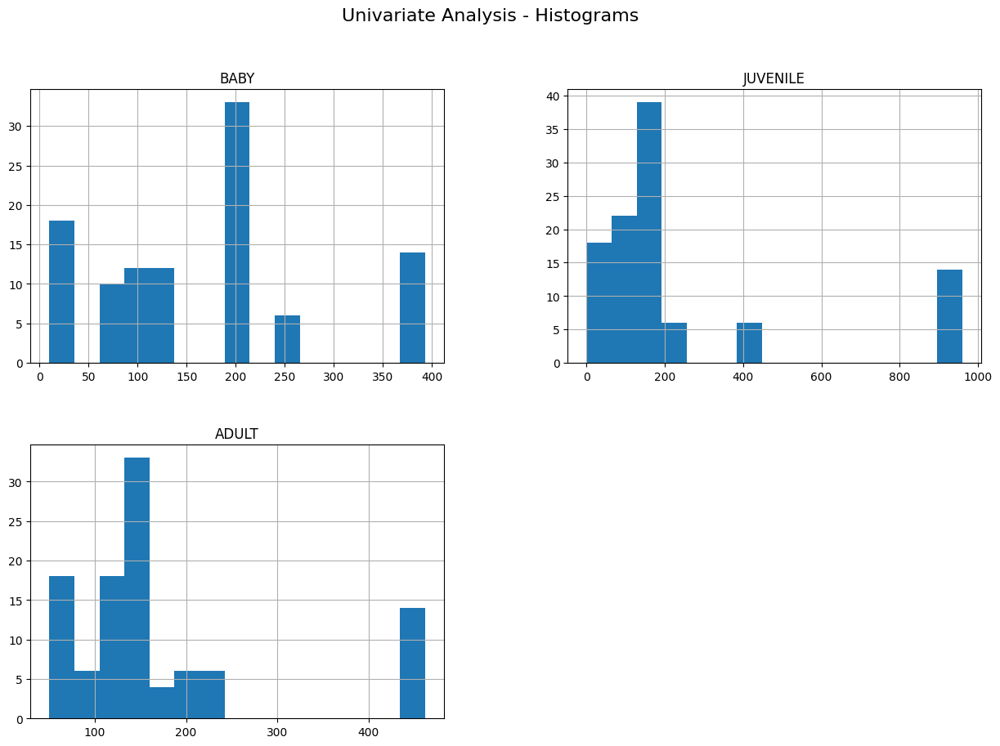

In [98]:
columns = df.columns.tolist()

# 2. Univariate Analysis
plt.figure(figsize=(12, 8))
df[columns].hist(bins=15, figsize=(15, 10))
plt.suptitle("Univariate Analysis - Histograms", fontsize=16)
plt.show()


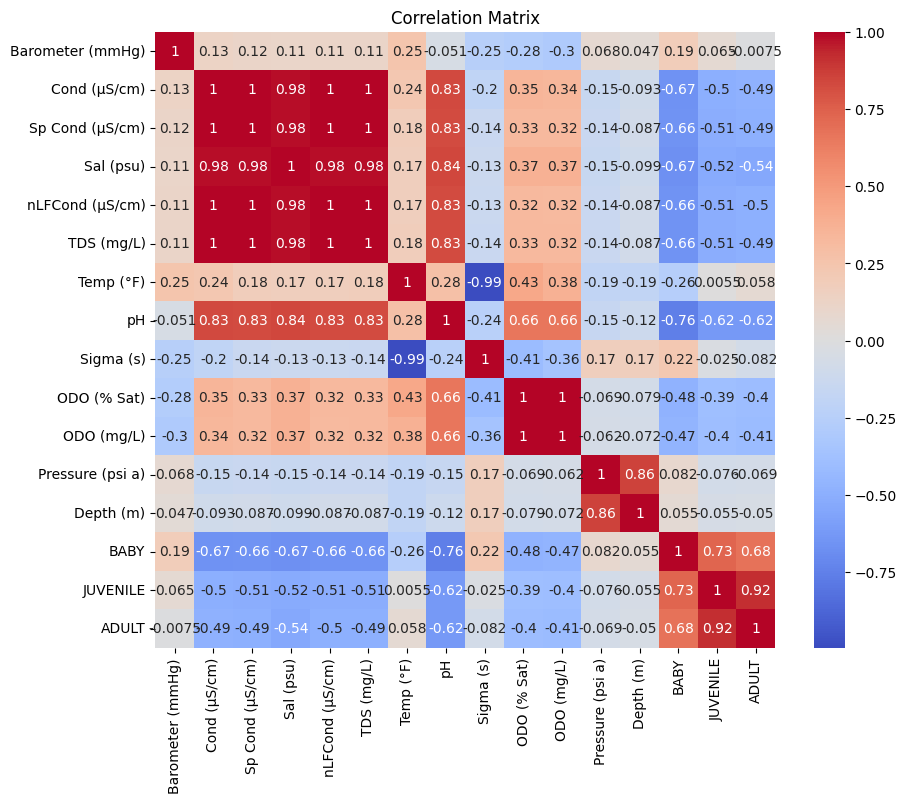

In [99]:
# 3. Corr Analysis
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

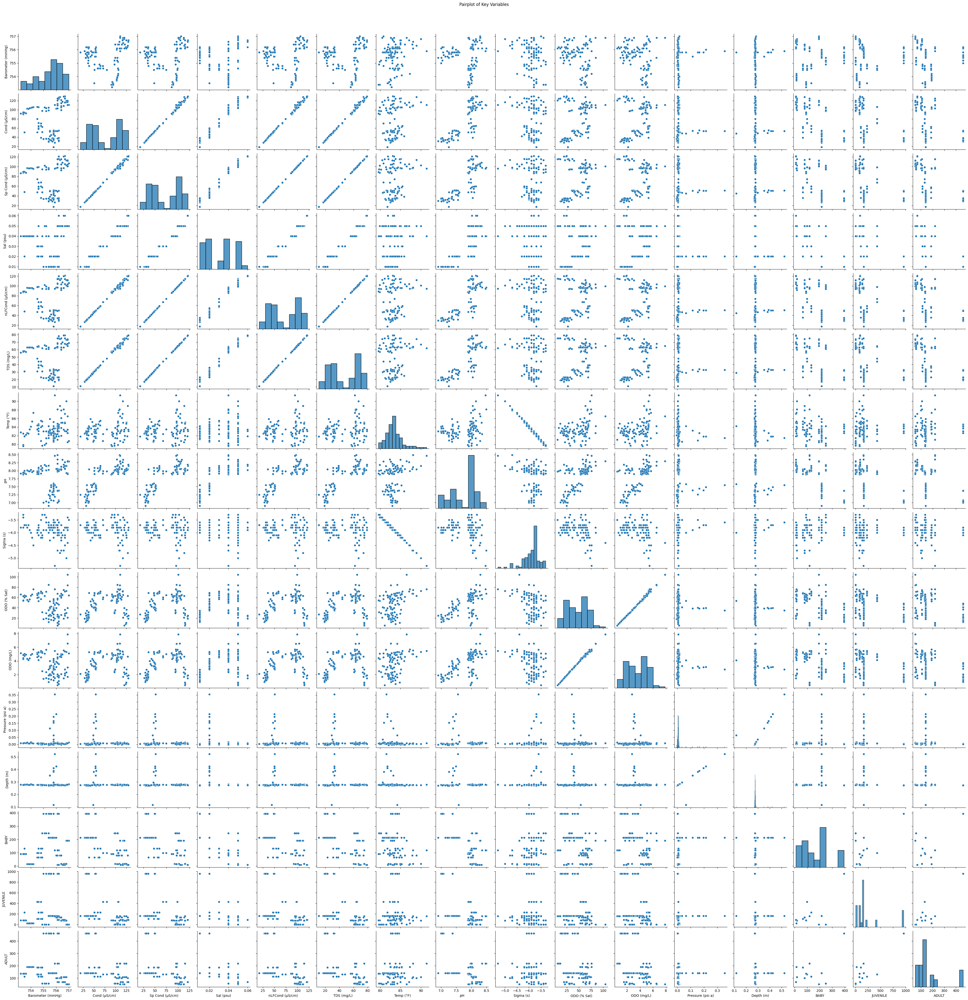

In [100]:
# Scatter plots to show relationships
sns.pairplot(df[columns])
plt.suptitle("Pairplot of Key Variables", y=1.02)
plt.show()

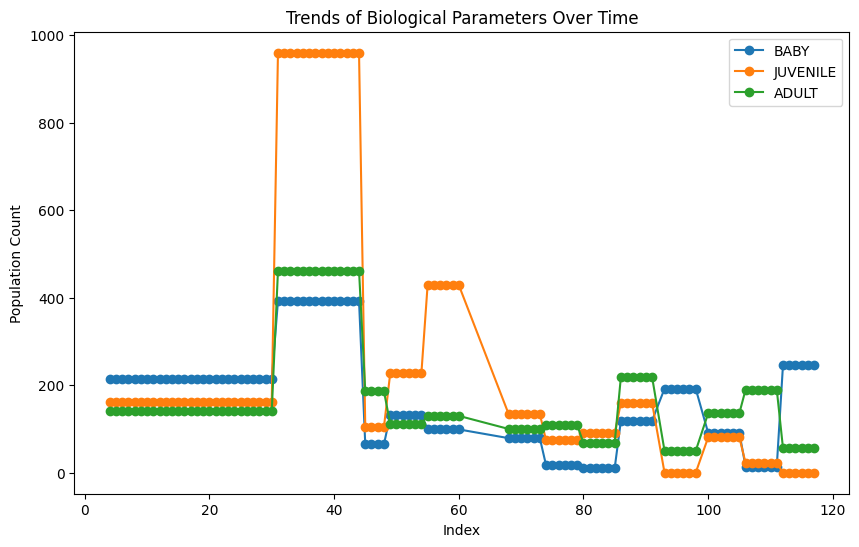

In [101]:
targets = ['BABY', 'JUVENILE', 'ADULT']
# 4. Biological Parameter Analysis
plt.figure(figsize=(10, 6))
for i in targets:
  plt.plot(df.index, df[i], label=i, marker='o')
plt.legend()
plt.title('Trends of Biological Parameters Over Time')
plt.xlabel('Index')
plt.ylabel('Population Count')
plt.show()

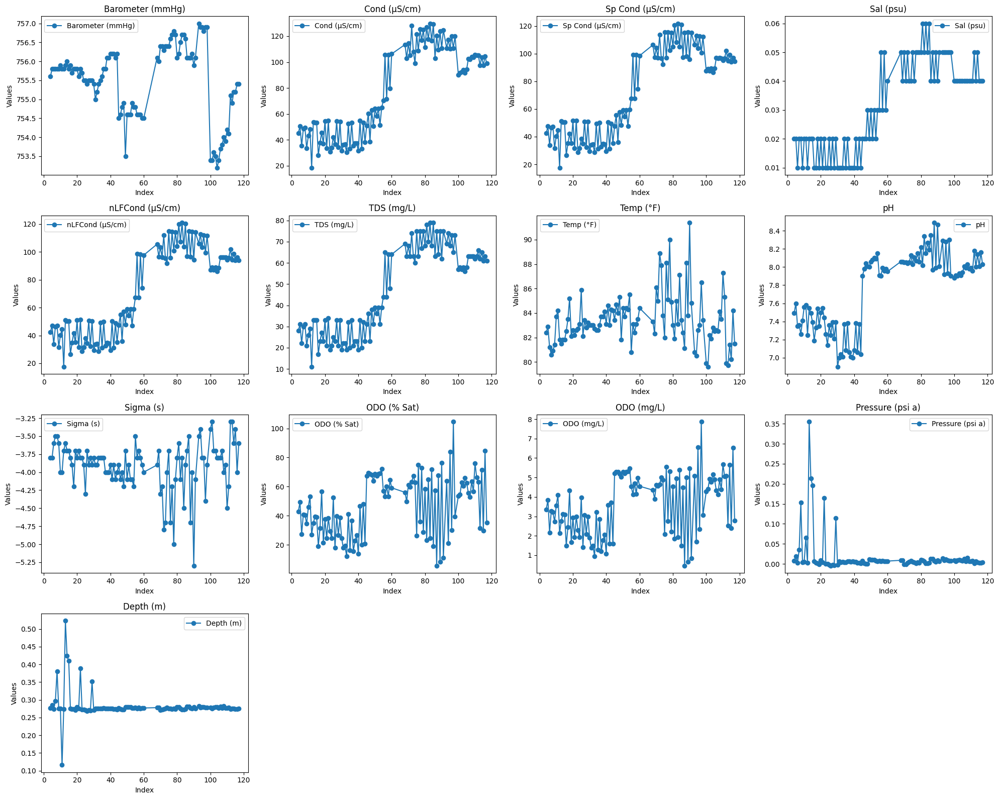

In [102]:
feature = columns.copy()
for i in targets:
    feature.remove(i)

# Number of features to plot
num_features = len(feature)

# Calculate the number of rows and columns needed for the subplots
max_cols = 4
num_rows = (num_features + max_cols - 1) // max_cols  # Ceiling division

# Create subplots
fig, axes = plt.subplots(num_rows, max_cols, figsize=(20, 4 * num_rows))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each feature in a separate subplot
for idx, i in enumerate(feature):
    axes[idx].plot(df.index, df[i], label=i, marker='o')
    axes[idx].legend()
    axes[idx].set_title(i)
    axes[idx].set_xlabel('Index')
    axes[idx].set_ylabel('Values')

# Hide any unused subplots
for j in range(num_features, num_rows * max_cols):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()



# **NORMALISATION**

In [230]:
targets = ['BABY', 'JUVENILE', 'ADULT']

scaler = RobustScaler()

scaled_state_df = df.copy()
columns_to_scale = df.columns.difference(targets)
scaled_state_df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

df = scaled_state_df

print("\nScaled df:")
df.head()




Scaled df:


,Barometer (mmHg),Cond (µS/cm),Sp Cond (µS/cm),Sal (psu),nLFCond (µS/cm),TDS (mg/L),Temp (°F),pH,Sigma (s),ODO (% Sat),ODO (mg/L),Pressure (psi a),Depth (m),BABY,JUVENILE,ADULT
4,-0.166667,-0.435644,-0.447415,-0.5,-0.451264,-0.444444,-0.333333,-0.671642,0.333333,-0.184573,-0.179211,0.333333,0.25,214.0,161.0,140.0
5,0.000000,-0.344884,-0.358289,-0.5,-0.362816,-0.361111,-0.095238,-0.507463,0.333333,0.000000,0.000000,2.166667,2.25,214.0,161.0,140.0
6,0.000000,-0.595710,-0.602496,-1.0,-0.608303,-0.611111,-0.904762,-0.880597,1.000000,-0.608815,-0.602151,-0.500000,-0.50,214.0,161.0,140.0
7,0.000000,-0.377888,-0.372549,-0.5,-0.375451,-0.388889,-1.190476,-0.865672,1.333333,-0.236915,-0.211470,4.833333,5.25,214.0,161.0,140.0
8,0.000000,-0.366337,-0.361854,-0.5,-0.364621,-0.361111,-1.047619,-1.014925,1.333333,-0.250689,-0.229391,24.500000,26.25,214.0,161.0,140.0


# **FEATURE SELECTION (HIGH COMPUTE)**


## **Best Feature Selection Method**

In [104]:
# Dictionary of feature selection methods
feature_selection_methods = {
    'Pearson Correlation': select_features_by_pearson_correlation,
    'Spearman Correlation': select_features_by_spearman_correlation,
    'Variance Threshold': select_features_by_variance,
    'Kruskal-Wallis':select_features_by_kruskal,
    'Mann-Whitney Pairwise test': select_features_by_mann_whitney,
    'Forward Selection': select_features_forward_selection,
    'Recursive Feature Elimination': select_features_rfe,
    'Boruta': select_features_boruta,
    'L1/Lasso': select_features_lasso,
    'L2/Ridge': select_features_ridge,
    'VarImp Random Forest': select_features_varimp_rf,
}

In [105]:
# Initialize a dictionary to store results
fs_results = {}

# Loop through each feature selection method
for method_name, method in feature_selection_methods.items():
    print(f"Evaluating method: {method_name}")

    # Apply feature selection method
    df_selected, selected_features = method(df, targets)

    # Check if any features are selected
    if not selected_features:
        print(f"No features selected for method: {method_name}")
        continue

    # Prepare data for model training
    X = df[selected_features]
    y = df[targets]  # Use the first target for model fitting (you can loop through targets if needed)

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize the MLP Regressor
    mlp = MLPRegressor(
            hidden_layer_sizes=(100,),  # 1 hidden layer with 100 neurons
            activation='relu',
            solver='adam',
            max_iter=2000,
            random_state=42,
            validation_fraction=0.1,  # Fraction of data to use for validation
        )

    # Fit the model
    mlp.fit(X_train, y_train)

    # Make predictions
    y_pred = mlp.predict(X_test)

    # Calculate performance metric (NRMSE)
    rmse, nrmse = calculate_nrmse(y_test, y_pred)

    # Store the result and selected features in a tuple
    fs_results[method_name] = (nrmse, selected_features)
    print(f"NRMSE for {method_name}: {nrmse}")
    print(f"Selected features for {method_name}: {selected_features}")
    print("______________________________________________________________________________________")


Evaluating method: Pearson Correlation


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for Pearson Correlation: 0.16569166971154453
Selected features for Pearson Correlation: ['Barometer (mmHg)', 'Cond (µS/cm)', 'Sp Cond (µS/cm)', 'Sal (psu)', 'nLFCond (µS/cm)', 'TDS (mg/L)', 'Temp (°F)', 'pH', 'Sigma (s)', 'ODO (% Sat)', 'ODO (mg/L)', 'Pressure (psi a)', 'Depth (m)']
______________________________________________________________________________________
Evaluating method: Spearman Correlation


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for Spearman Correlation: 0.16569166971154453
Selected features for Spearman Correlation: ['Barometer (mmHg)', 'Cond (µS/cm)', 'Sp Cond (µS/cm)', 'Sal (psu)', 'nLFCond (µS/cm)', 'TDS (mg/L)', 'Temp (°F)', 'pH', 'Sigma (s)', 'ODO (% Sat)', 'ODO (mg/L)', 'Pressure (psi a)', 'Depth (m)']
______________________________________________________________________________________
Evaluating method: Variance Threshold


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for Variance Threshold: 0.16553410215867187
Selected features for Variance Threshold: ['Barometer (mmHg)', 'Sal (psu)', 'Temp (°F)', 'Sigma (s)', 'Pressure (psi a)', 'Depth (m)']
______________________________________________________________________________________
Evaluating method: Kruskal-Wallis


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for Kruskal-Wallis: 0.16574715078531008
Selected features for Kruskal-Wallis: ['pH', 'Depth (m)', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)', 'Sal (psu)', 'TDS (mg/L)', 'Sp Cond (µS/cm)', 'Sigma (s)', 'nLFCond (µS/cm)', 'ODO (% Sat)']
______________________________________________________________________________________
Evaluating method: Mann-Whitney Pairwise test


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for Mann-Whitney Pairwise test: 0.16574715078531008
Selected features for Mann-Whitney Pairwise test: ['pH', 'Depth (m)', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)', 'Sal (psu)', 'TDS (mg/L)', 'Sp Cond (µS/cm)', 'Sigma (s)', 'nLFCond (µS/cm)', 'ODO (% Sat)']
______________________________________________________________________________________
Evaluating method: Forward Selection


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for Forward Selection: 0.1604644094957745
Selected features for Forward Selection: ['pH', 'Depth (m)', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)', 'Sigma (s)', 'ODO (% Sat)']
______________________________________________________________________________________
Evaluating method: Recursive Feature Elimination


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for Recursive Feature Elimination: 0.17098509109531565
Selected features for Recursive Feature Elimination: ['pH', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Temp (°F)', 'TDS (mg/L)', 'Sp Cond (µS/cm)', 'nLFCond (µS/cm)', 'ODO (% Sat)']
______________________________________________________________________________________
Evaluating method: Boruta
Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	3
Tentative: 	5
Rejected: 	5
Iteration: 	9 / 100
Confirmed: 	3
Tentative: 	5
Rejected: 	5
Iteration: 	10 / 100
Confirmed: 	3
Tentative: 	5
Rejected: 	5
Iteration: 	11 / 100
Confirmed: 

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158208.08009102367, tolerance: 135.39899523809524
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101378.61695046684, tolerance: 54.041175
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\l

NRMSE for Boruta: 0.1656342417646227
Selected features for Boruta: ['pH', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Temp (°F)']
______________________________________________________________________________________
Evaluating method: L1/Lasso


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for L1/Lasso: 0.16481587444598458
Selected features for L1/Lasso: ['pH', 'Depth (m)', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)', 'Sal (psu)', 'Sp Cond (µS/cm)', 'Sigma (s)', 'nLFCond (µS/cm)', 'ODO (% Sat)']
______________________________________________________________________________________
Evaluating method: L2/Ridge


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


NRMSE for L2/Ridge: 0.1657583426581917
Selected features for L2/Ridge: ['Depth (m)', 'pH', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)', 'TDS (mg/L)', 'Sal (psu)', 'Sp Cond (µS/cm)', 'Sigma (s)', 'nLFCond (µS/cm)', 'ODO (% Sat)']
______________________________________________________________________________________
Evaluating method: VarImp Random Forest
NRMSE for VarImp Random Forest: 0.17719282873536119
Selected features for VarImp Random Forest: ['pH', 'Barometer (mmHg)']
______________________________________________________________________________________


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [106]:
# Assuming fs_results is a dictionary where keys are method names and values are NRMSE scores

# Sort the methods based on NRMSE values
sorted_methods = sorted(fs_results.items(), key=lambda x: x[1])

# Print the best method
best_method = sorted_methods[0][0]  # Best method is the first element after sorting
best_nrmse = sorted_methods[0][1]

print(f"\nBest feature selection method: {best_method} with NRMSE: {best_nrmse[0]}")

all_selected_features = []

topnum = 15
# Print top n methods
print(f"\nTop {topnum} feature selection methods:")
for method, result in sorted_methods[:topnum]:  # Get the top 5 methods
    print(f"{method}: NRMSE = {result[0]}")
    print(f"Features = {result[1]}\n")
    for i in result[1]:
        all_selected_features.append(i)
        
# Save all_selected_features variables to a file
dump(all_selected_features, 'all_selected_features.joblib')


Best feature selection method: Forward Selection with NRMSE: 0.1604644094957745

Top 15 feature selection methods:
Forward Selection: NRMSE = 0.1604644094957745
Features = ['pH', 'Depth (m)', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)', 'Sigma (s)', 'ODO (% Sat)']

L1/Lasso: NRMSE = 0.16481587444598458
Features = ['pH', 'Depth (m)', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)', 'Sal (psu)', 'Sp Cond (µS/cm)', 'Sigma (s)', 'nLFCond (µS/cm)', 'ODO (% Sat)']

Variance Threshold: NRMSE = 0.16553410215867187
Features = ['Barometer (mmHg)', 'Sal (psu)', 'Temp (°F)', 'Sigma (s)', 'Pressure (psi a)', 'Depth (m)']

Boruta: NRMSE = 0.1656342417646227
Features = ['pH', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Temp (°F)']

Pearson Correlation: NRMSE = 0.16569166971154453
Features = ['Barometer (mmHg)', 'Cond (µS/cm)', 'Sp Cond (µS/cm)', 'Sal (psu)', 'nLFCond (µS/cm)', 'TDS (mg/L)', 'Temp (°F)', 'pH', 'Sigma (s)',

['all_selected_features.joblib']

In [107]:
# Define the range of vote thresholds to test
vote_thresholds = [i / len(feature_selection_methods) for i in range(0, len(feature_selection_methods) + 1)]

# Initialize a dictionary to store NRMSE results for each threshold
threshold_nrmse_results = {}

best_nrmse = float("inf")

# Loop over each vote threshold and evaluate NRMSE
for vote_threshold in vote_thresholds:
    print(f"\nEvaluating ensemble feature selection with vote threshold: {vote_threshold:.2f}")

    # Get the combined features from the ensemble method with the current vote threshold
    selected_features = select_ensemble_features_by_voting(all_selected_features, vote_threshold=vote_threshold)

    if not selected_features:
        print("No features selected for this threshold.")
        continue
    
    # Prepare data for model training
    X = df[selected_features]
    y = df[targets]  # Use the first target for model fitting

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize the MLP Regressor
    mlp = MLPRegressor(
        hidden_layer_sizes=(100,),
        activation='relu',
        solver='adam',
        max_iter=2000,
        random_state=42,
        validation_fraction=0.1,
    )

    # Fit the model
    mlp.fit(X_train, y_train)

    # Make predictions
    y_pred = mlp.predict(X_test)

    # Calculate performance metric (NRMSE)
    rmse, nrmse = calculate_nrmse(y_test, y_pred)
    
    # Check if this is the best NRMSE so far
    if nrmse < best_nrmse:
        best_nrmse = nrmse
        best_feature_set = selected_features
        best_vote_threshold = vote_threshold
        
# Save variables to a file
dump(best_nrmse, 'best_nrmse.joblib')
dump(best_feature_set, 'best_feature_set.joblib')
dump(best_vote_threshold, 'best_vote_threshold.joblib')


Evaluating ensemble feature selection with vote threshold: 0.00


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.09


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.18


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.27


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.36


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.45


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.55


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.64


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.73


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.82


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 0.91


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(



Evaluating ensemble feature selection with vote threshold: 1.00


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


['best_vote_threshold.joblib']

In [108]:
print(f"\nBest vote threshold: {best_vote_threshold:.2f} with NRMSE: {best_nrmse}")
print(f"\nSelected Features: {best_feature_set}")


Best vote threshold: 0.73 with NRMSE: 0.1604644094957745

Selected Features: ['pH', 'Depth (m)', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)', 'Sigma (s)', 'ODO (% Sat)']


In [110]:
df_reduced, removed_features = remove_highly_correlated_features(df[best_feature_set], correlation_threshold=0.9)
print(f"Removed features: {removed_features}")

# Save variables to a file
dump(best_feature_set, 'best_feature_set.joblib')
dump(df_reduced, 'df_reduced.joblib')
dump(removed_features, 'removed_features.joblib')

Removed features: ['Sigma (s)', 'ODO (% Sat)']


['removed_features.joblib']

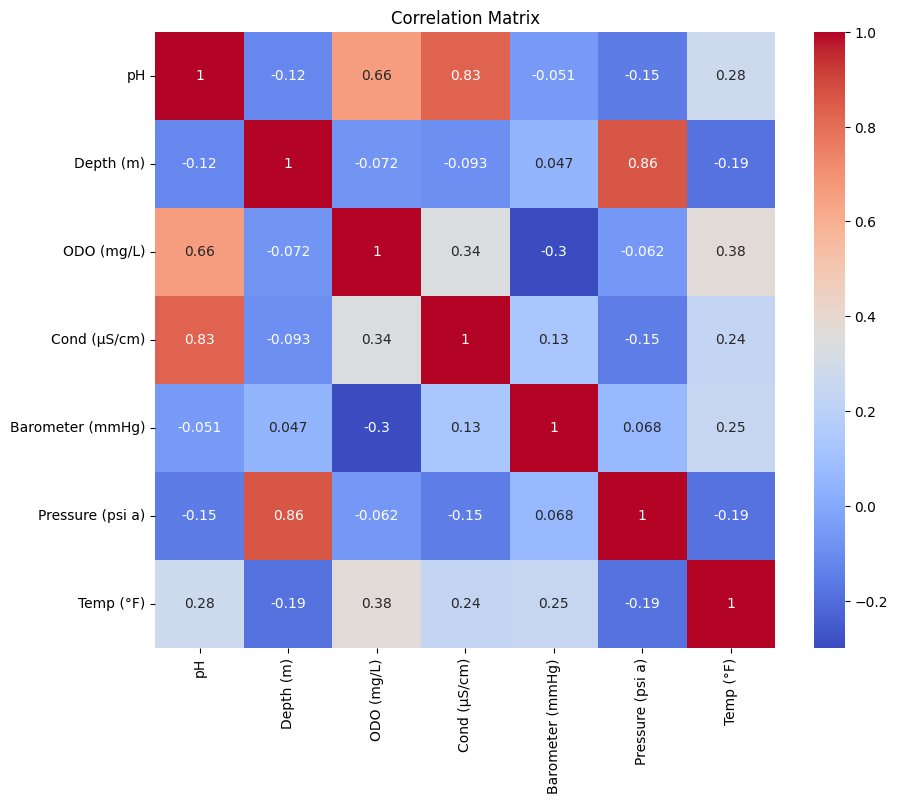

In [226]:
# 3. Corr Analysis
plt.figure(figsize=(10, 8))
sns.heatmap(df_reduced.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

In [111]:
# Prepare data for model training
X = df_reduced
y = df[targets]  # Use the first target for model fitting

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the MLP Regressor
mlp = MLPRegressor(
    hidden_layer_sizes=(100,),
    activation='relu',
    solver='adam',
    max_iter=2000,
    random_state=42,
    validation_fraction=0.1,
)

# Fit the model
mlp.fit(X_train, y_train)

# Make predictions
y_pred = mlp.predict(X_test)

# Calculate performance metric (NRMSE)
rmse, nrmse = calculate_nrmse(y_test, y_pred)

print(f"Best NRMSE: {nrmse}\nFeatures: {list(df_reduced.columns)}")

Best NRMSE: 0.15966978436221363
Features: ['pH', 'Depth (m)', 'ODO (mg/L)', 'Cond (µS/cm)', 'Barometer (mmHg)', 'Pressure (psi a)', 'Temp (°F)']


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


# **BEST MODEL (HIGH COMPUTE)**

## **Train Test Splits**

In [112]:
X = df_reduced
y = df[targets]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

train_df = pd.concat([X_train, y_train], axis=1)

dump(X_train, 'X_train.joblib')
dump(X_test, 'X_test.joblib')
dump(y_train, 'y_train.joblib')
dump(y_test, 'y_test.joblib')
dump(train_df, 'train_df.joblib')

['train_df.joblib']

## **Checking For Best Model**

In [113]:
drate = 0.3
# RNN Model with Dropout
rnn_model = Sequential()
rnn_model.add(SimpleRNN(50, activation='relu', input_shape=(1, X_train.shape[1])))
rnn_model.add(Dropout(drate))  # Dropout layer with 20% dropout rate
rnn_model.add(Dense(1, name='BABY'))  # For the first target (e.g., BABY)
rnn_model.add(Dense(1, name='JUVENILE'))  # For the second target (e.g., JUVENILE)
rnn_model.add(Dense(1, name='ADULT'))  # For the third target (e.g., ADULT)
rnn_model.compile(optimizer='adam', loss='mean_squared_error')

# CNN Model with Dropout
cnn_model = Sequential()
cnn_model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1], 1)))
cnn_model.add(Dropout(drate))  # Dropout layer with 20% dropout rate
cnn_model.add(Flatten())
cnn_model.add(Dense(128, activation='relu'))
cnn_model.add(Dropout(drate))  # Additional dropout layer before output
cnn_model.add(Dense(64)) 
cnn_model.add(Dropout(drate))
cnn_model.add(Dense(1, name='BABY'))  # For the first target (e.g., BABY)
cnn_model.add(Dense(1, name='JUVENILE'))  # For the second target (e.g., JUVENILE)
cnn_model.add(Dense(1, name='ADULT'))  # For the third target (e.g., ADULT)
cnn_model.compile(optimizer='adam', loss='mean_squared_error')

# LSTM Model with Dropout
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='relu', input_shape=(1, X_train.shape[1])))
lstm_model.add(Dropout(drate))  # Dropout layer with 20% dropout rate
lstm_model.add(Dense(1, name='BABY'))  # For the first target (e.g., BABY)
lstm_model.add(Dense(1, name='JUVENILE'))  # For the second target (e.g., JUVENILE)
lstm_model.add(Dense(1, name='ADULT'))  # For the third target (e.g., ADULT)
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# DFFNN Model with Dropout
dffnn_model = Sequential()
dffnn_model.add(Dense(128, activation='relu', input_dim=X_train.shape[1]))
dffnn_model.add(Dropout(drate))  # Dropout layer with 20% dropout rate
dffnn_model.add(Dense(64, activation='relu'))
dffnn_model.add(Dropout(drate))  # Additional dropout layer before output
dffnn_model.add(Dense(1, name='BABY'))  # For the first target (e.g., BABY)
dffnn_model.add(Dense(1, name='JUVENILE'))  # For the second target (e.g., JUVENILE)
dffnn_model.add(Dense(1, name='ADULT'))  # For the third target (e.g., ADULT)
dffnn_model.compile(optimizer='adam', loss='mean_squared_error')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__in

In [114]:
mlp = MLPRegressor(
    hidden_layer_sizes=(100,),
    max_iter=2000,
    random_state=42,
    early_stopping=True,  # Enable early stopping
    validation_fraction=0.1,  # Fraction of data to use for validation
    n_iter_no_change=10  # Number of iterations to wait before stopping
)

# Define all models
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "SVM": SVR(),
    "k-NN": KNeighborsRegressor(),
    "ANN (MLP)": mlp,
    "Multiple Linear Regression": LinearRegression(),
    "XGBoost": XGBRegressor(random_state=42),
    "GBM": GradientBoostingRegressor(random_state=42),
    "Maxent": LogisticRegression(random_state=42),
    "RNN": rnn_model,
    "LSTM": lstm_model,
    "CNN": cnn_model,
    "DNN": dffnn_model,
    "GAM" : LinearGAM(s(0) + s(1) + s(2)),
}

In [115]:
history = {}
predictions_initial = {}
model_results = {}

X_train_rnn = reshape_for_rnn_cnn(X_train, model_type="rnn")
X_test_rnn = reshape_for_rnn_cnn(X_test, model_type="rnn")
X_train_cnn = reshape_for_rnn_cnn(X_train, model_type="cnn")
X_test_cnn = reshape_for_rnn_cnn(X_test, model_type="cnn")

patience=10
epochs = 1000
# Training and storing results for each model
for model_name, model in models.items():
  print(f"\nTraining {model_name}...")

  # Handle RNN, LSTM, CNN models that need reshaped input
  if model_name in ["RNN", "LSTM"]:
    predictions_initial[model_name], model_results[model_name], history[model_name] = train(model,
                                                                                       X_train_rnn, y_train, X_test_rnn, y_test,
                                                                                       model_name = model_name, 
                                                                                       patience=patience, 
                                                                                       epochs=epochs,
                                                                                       earlystop= True
                                                                                       )
  elif model_name in ["CNN"]:
    predictions_initial[model_name], model_results[model_name], history[model_name] = train(model, 
                                                                                       X_train_cnn, y_train, X_test_cnn, y_test, 
                                                                                       model_name = model_name, 
                                                                                       patience=patience, 
                                                                                       epochs=epochs,
                                                                                       earlystop= True
                                                                                       )
  else:
    try:
      predictions_initial[model_name], model_results[model_name], history[model_name] = train(model, 
                                                                                         X_train, y_train, X_test, y_test, 
                                                                                         model_name = model_name, 
                                                                                         patience=patience, 
                                                                                         epochs=epochs,
                                                                                         earlystop= True
                                                                                         )
    except:
      predictions_initial[model_name], model_results[model_name], history[model_name] = train(MultiOutputRegressor(model), 
                                                                                         X_train, y_train, X_test, y_test, 
                                                                                         model_name = model_name, 
                                                                                         patience=patience, 
                                                                                         epochs=epochs,
                                                                                         earlystop= True
                                                                                         )
dump(model_results, 'model_results.joblib')
dump(predictions_initial, 'predictions_initial.joblib')


Training Random Forest...
BABY: NRMSE: 0.1291, RMSE: 48.93, R2: 0.8245, MAE: 33.13, MASE: 0.2786
JUVENILE: NRMSE: 0.1933, RMSE: 185.61, R2: 0.6248, MAE: 100.31, MASE: 0.3582
ADULT: NRMSE: 0.1890, RMSE: 76.75, R2: 0.5956, MAE: 43.12, MASE: 0.3871

Training Decision Tree...
BABY: NRMSE: 0.1321, RMSE: 50.06, R2: 0.8163, MAE: 20.00, MASE: 0.1682
JUVENILE: NRMSE: 0.1862, RMSE: 178.72, R2: 0.6522, MAE: 52.52, MASE: 0.1876
ADULT: NRMSE: 0.2012, RMSE: 81.67, R2: 0.5421, MAE: 30.33, MASE: 0.2723

Training SVM...
BABY: NRMSE: 0.3084, RMSE: 116.89, R2: -0.0013, MAE: 95.91, MASE: 0.8066
JUVENILE: NRMSE: 0.3300, RMSE: 316.79, R2: -0.0929, MAE: 173.72, MASE: 0.6204
ADULT: NRMSE: 0.3167, RMSE: 128.59, R2: -0.1352, MAE: 72.53, MASE: 0.6511

Training k-NN...
BABY: NRMSE: 0.1646, RMSE: 62.37, R2: 0.7150, MAE: 48.64, MASE: 0.4091
JUVENILE: NRMSE: 0.2427, RMSE: 233.00, R2: 0.4088, MAE: 143.20, MASE: 0.5114
ADULT: NRMSE: 0.2293, RMSE: 93.08, R2: 0.4053, MAE: 56.82, MASE: 0.5100

Training ANN (MLP)...


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


BABY: NRMSE: 0.2228, RMSE: 84.45, R2: 0.4773, MAE: 64.40, MASE: 0.5416
JUVENILE: NRMSE: 0.2417, RMSE: 232.00, R2: 0.4139, MAE: 164.63, MASE: 0.5880
ADULT: NRMSE: 0.2343, RMSE: 95.13, R2: 0.3787, MAE: 62.36, MASE: 0.5598

Training Multiple Linear Regression...
BABY: NRMSE: 0.2334, RMSE: 88.45, R2: 0.4266, MAE: 76.58, MASE: 0.6441
JUVENILE: NRMSE: 0.2643, RMSE: 253.69, R2: 0.2991, MAE: 202.03, MASE: 0.7215
ADULT: NRMSE: 0.2413, RMSE: 97.95, R2: 0.3413, MAE: 72.43, MASE: 0.6502

Training XGBoost...
BABY: NRMSE: 0.2013, RMSE: 76.28, R2: 0.5737, MAE: 54.01, MASE: 0.4542
JUVENILE: NRMSE: 0.1791, RMSE: 171.95, R2: 0.6780, MAE: 57.71, MASE: 0.2061
ADULT: NRMSE: 0.1923, RMSE: 78.07, R2: 0.5815, MAE: 37.52, MASE: 0.3368

Training GBM...
BABY: NRMSE: 0.1686, RMSE: 63.90, R2: 0.7008, MAE: 46.95, MASE: 0.3949
JUVENILE: NRMSE: 0.1869, RMSE: 179.40, R2: 0.6495, MAE: 80.53, MASE: 0.2876
ADULT: NRMSE: 0.1771, RMSE: 71.91, R2: 0.6450, MAE: 36.69, MASE: 0.3293

Training Maxent...
BABY: NRMSE: 0.1951, RMS

['predictions_initial.joblib']

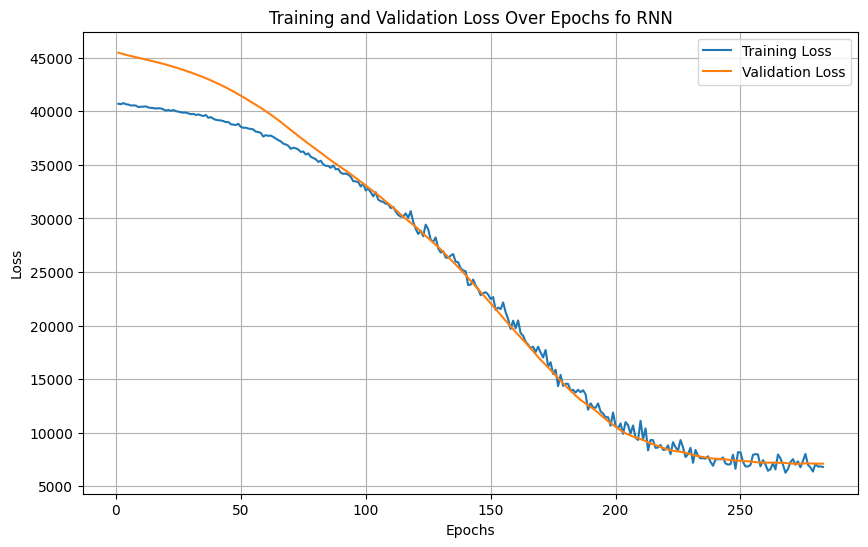

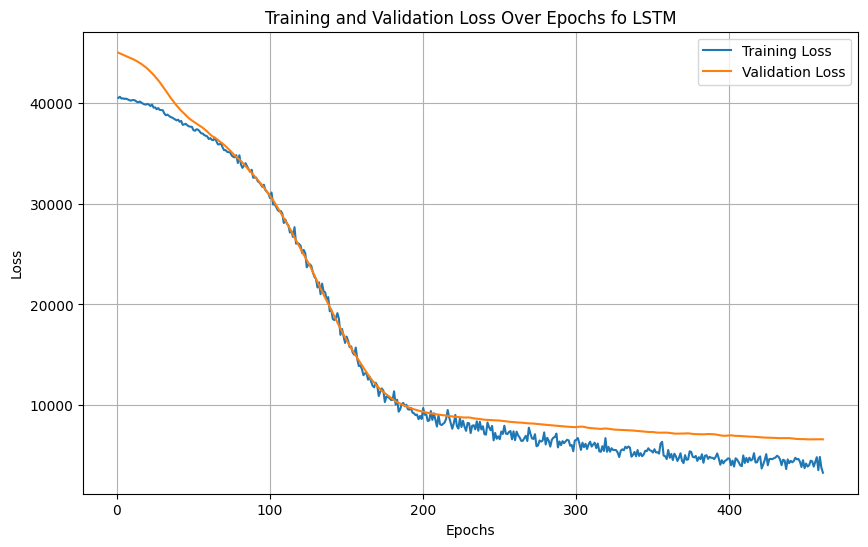

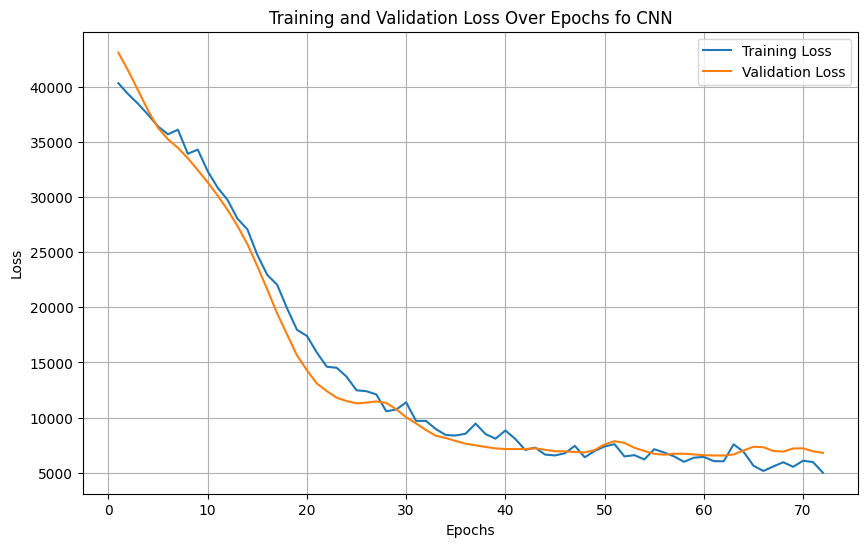

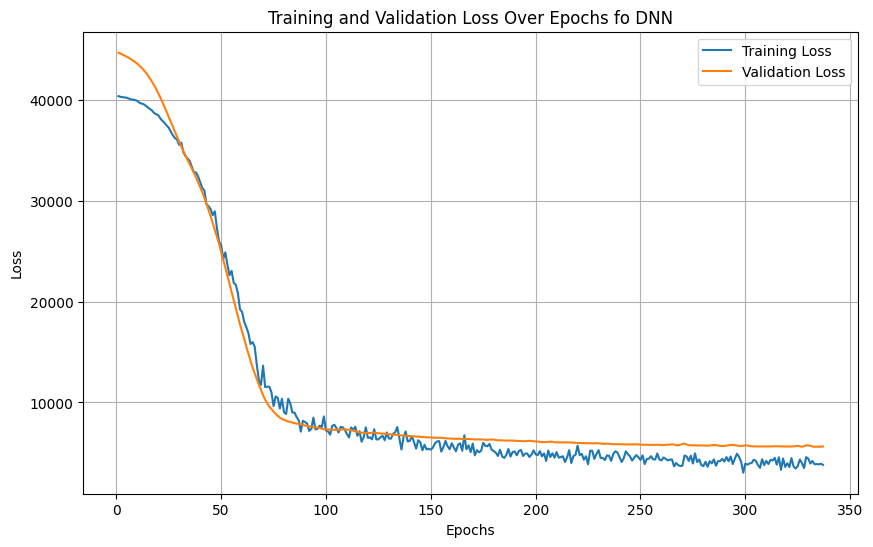

In [116]:
for i in ['RNN', 'LSTM', 'CNN','DNN']:
    # Extract training and validation loss
    train_loss = history[i].history['loss']
    val_loss = history[i].history['val_loss']
    epochs = range(1, len(train_loss) + 1)

    # Plot training and validation loss
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title(f'Training and Validation Loss Over Epochs fo {i}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [117]:
# Compare models and choose the best based on RMSE
best_models, best_model_metrics = compare_models(model_results, 15)

# Print out the best models and their results
print("\nBest Models based on target:")
for model_name, results in best_models.items():
    print(f"{model_name}: {results}")


Top 15 Models Based on Average NRMSE (sorted in ascending order):
  1. Model: Random Forest, Average NRMSE: 0.1705
  2. Model: Decision Tree, Average NRMSE: 0.1731
  3. Model: GBM, Average NRMSE: 0.1775
  4. Model: XGBoost, Average NRMSE: 0.1909
  5. Model: k-NN, Average NRMSE: 0.2122
  6. Model: ANN (MLP), Average NRMSE: 0.2329
  7. Model: Multiple Linear Regression, Average NRMSE: 0.2463
  8. Model: LSTM, Average NRMSE: 0.2544
  9. Model: CNN, Average NRMSE: 0.2568
  10. Model: DNN, Average NRMSE: 0.2575
  11. Model: RNN, Average NRMSE: 0.2619
  12. Model: Maxent, Average NRMSE: 0.2721
  13. Model: GAM, Average NRMSE: 0.2879
  14. Model: SVM, Average NRMSE: 0.3184

Top 15 Models Based on Average RMSE (sorted in ascending order):
  1. Model: Decision Tree, Average RMSE: 103.4828
  2. Model: Random Forest, Average RMSE: 103.7656
  3. Model: GBM, Average RMSE: 105.069
  4. Model: XGBoost, Average RMSE: 108.7666
  5. Model: k-NN, Average RMSE: 129.4803
  6. Model: ANN (MLP), Average RMS

In [118]:
# Level 1 Models (Bagging + Boosting)
level_1_models = [
    ('random_forest', RandomForestRegressor(random_state=42)),  # Bagging
    ('xgboost', XGBRegressor(random_state=42)),  # Boosting
    ('xgbrf', xgbrf_model),  # Custom XGBRF model
    ('gbm', GradientBoostingRegressor(random_state=42)),
    ('dt', DecisionTreeRegressor(random_state=42))
]
# Meta-Learner (Decision Tree)
meta_model = Ridge()
# Stacking Regressor
stacking_reg = MultiOutputRegressor(StackingRegressor(estimators=level_1_models, final_estimator=meta_model))

In [119]:
# Level 1 Models (Bagging + Boosting)
level_1_models = [
    ('random_forest', RandomForestRegressor(random_state=42)),  # Bagging
    ('xgboost', XGBRegressor(random_state=42)),  # Boosting
]
# Meta-Learner (Decision Tree)
meta_model = Ridge()
# Stacking Regressor
stacking_xgrf_reg = MultiOutputRegressor(StackingRegressor(estimators=level_1_models, final_estimator=meta_model))

In [120]:
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "Stacking": stacking_reg,
    "Stacking XGRF": stacking_xgrf_reg,
    "GBM": MultiOutputRegressor(GradientBoostingRegressor(random_state=42)),
    "XGBRF": xgbrf_model,
    "Decision Tree": DecisionTreeRegressor(random_state=42)
}

In [121]:
# Dictionary to store model results
ens_model_results = {}

# Training and storing results for each model
for model_name, model in models.items():
  print(f"\nTraining {model_name}...")

  p, ens_model_results[model_name], h = train(model, X_train, y_train, X_test, y_test)
dump(ens_model_results, 'ens_model_results.joblib')


Training Random Forest...
BABY: NRMSE: 0.1291, RMSE: 48.93, R2: 0.8245, MAE: 33.13, MASE: 0.2786
JUVENILE: NRMSE: 0.1933, RMSE: 185.61, R2: 0.6248, MAE: 100.31, MASE: 0.3582
ADULT: NRMSE: 0.1890, RMSE: 76.75, R2: 0.5956, MAE: 43.12, MASE: 0.3871

Training XGBoost...
BABY: NRMSE: 0.2013, RMSE: 76.28, R2: 0.5737, MAE: 54.01, MASE: 0.4542
JUVENILE: NRMSE: 0.1791, RMSE: 171.95, R2: 0.6780, MAE: 57.71, MASE: 0.2061
ADULT: NRMSE: 0.1923, RMSE: 78.07, R2: 0.5815, MAE: 37.52, MASE: 0.3368

Training Stacking...
BABY: NRMSE: 0.1478, RMSE: 56.03, R2: 0.7699, MAE: 42.74, MASE: 0.3595
JUVENILE: NRMSE: 0.1838, RMSE: 176.47, R2: 0.6609, MAE: 101.58, MASE: 0.3628
ADULT: NRMSE: 0.1807, RMSE: 73.36, R2: 0.6305, MAE: 42.83, MASE: 0.3845

Training Stacking XGRF...
BABY: NRMSE: 0.1690, RMSE: 64.04, R2: 0.6995, MAE: 48.05, MASE: 0.4041
JUVENILE: NRMSE: 0.1806, RMSE: 173.35, R2: 0.6728, MAE: 78.19, MASE: 0.2792
ADULT: NRMSE: 0.1846, RMSE: 74.97, R2: 0.6142, MAE: 42.04, MASE: 0.3774

Training GBM...
BABY: NR

['ens_model_results.joblib']

In [122]:
# Compare models and choose the best based on RMSE
ens_best_models, ens_best_models_metrics = compare_models(ens_model_results, 6)

# Print out the best models and their results
print("\nBest Models based on target:")
for model_name, results in ens_best_models.items():
    print(f"{model_name}: {results}")


Top 6 Models Based on Average NRMSE (sorted in ascending order):
  1. Model: XGBRF, Average NRMSE: 0.1704
  2. Model: Random Forest, Average NRMSE: 0.1705
  3. Model: Stacking, Average NRMSE: 0.1708
  4. Model: Decision Tree, Average NRMSE: 0.1731
  5. Model: GBM, Average NRMSE: 0.1775
  6. Model: Stacking XGRF, Average NRMSE: 0.1781

Top 6 Models Based on Average RMSE (sorted in ascending order):
  1. Model: XGBRF, Average RMSE: 101.0639
  2. Model: Stacking, Average RMSE: 101.9537
  3. Model: Decision Tree, Average RMSE: 103.4828
  4. Model: Random Forest, Average RMSE: 103.7656
  5. Model: Stacking XGRF, Average RMSE: 104.1178
  6. Model: GBM, Average RMSE: 105.069

Top 6 Models Based on Average R2 (sorted in descending order):
  1. Model: XGBRF, Average R2: 0.6887
  2. Model: Stacking, Average R2: 0.6871
  3. Model: Random Forest, Average R2: 0.6817
  4. Model: Decision Tree, Average R2: 0.6702
  5. Model: GBM, Average R2: 0.6651
  6. Model: Stacking XGRF, Average R2: 0.6621

Top 

# **HYPERPARAMETER TUNING (EXTREMELY HIGH COMPUTE)**

### Hyperparameter Tuning for Ensemble

#### Find Parameter

In [165]:
# Evaluate the best model
best_params_xg = tune_xgb(X_train, y_train)
best_params_rf = tune_rf(X_train, y_train)

# Save variables to a file
dump(best_params_xg, 'best_params_xg.joblib')
dump(best_params_rf, 'best_params_rf.joblib')

Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters from Random Search: {'subsample': 0.7250000000000001, 'n_estimators': 245, 'min_child_weight': 1, 'max_depth': 2, 'learning_rate': 0.07500000000000001, 'colsample_bytree': 0.8}
Best Cross-Validation MSE from Random Search: 7174.06823085782
Fitting 5 folds for each of 540 candidates, totalling 2700 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters from Random Search: {'n_estimators': 51, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': None}
Best Cross-Validation MSE from Random Search: 9510.85702064649


['best_params_rf.joblib']

In [166]:
best_params_gbm = tune_gbm_multioutput(X_train, y_train)
# Save variables to a file
dump(best_params_gbm, 'best_params_gbm.joblib')

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters from Random Search: {'estimator__subsample': 0.9, 'estimator__n_estimators': 341, 'estimator__min_samples_split': 11, 'estimator__min_samples_leaf': 1, 'estimator__max_features': 'sqrt', 'estimator__max_depth': 2, 'estimator__learning_rate': 0.17500000000000002}
Best Cross-Validation MSE from Random Search: 7683.181369152527


['best_params_gbm.joblib']

In [167]:
best_params_dt = tune_decision_tree(X_train, y_train)
# Save variables to a file
dump(best_params_dt, 'best_params_dt.joblib')

Fitting 5 folds for each of 270 candidates, totalling 1350 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters from Random Search: {'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 10, 'criterion': 'squared_error'}
Best Cross-Validation MSE from Random Search: 13983.00802894491


['best_params_dt.joblib']

In [168]:
best_params_xgbrf = tune_xgb_rf(X_train, y_train)
# Save variables to a file
dump(best_params_xgbrf, 'best_params_xgbrf.joblib')

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters from Random Search: {'subsample': 1.0, 'num_parallel_tree': 53, 'max_depth': 11, 'eta': 0.001, 'colsample_bynode': 0.5}
Best Cross-Validation MSE from Random Search: 8513.67215118199


['best_params_xgbrf.joblib']

In [169]:
# Models with pre-set parameters
rf = RandomForestRegressor(**best_params_rf)
xg = XGBRegressor(**best_params_xg)
xgbrf = XGBRFRegressor(**best_params_xgbrf)
gbm = GradientBoostingRegressor(**remove_estimator__(best_params_gbm))
dt_model = DecisionTreeRegressor(**best_params_dt)

In [170]:
# Model options for stacking
model_options = [
    ('random_forest', rf),
    ('xgboost', xg),
    ('xgbrf', xgbrf),
    ('gbm', gbm),
    ('decision tree', dt_model)
]

# Define hyperparameter grid for the Ridge meta-model for Grid Search
grid_param = {
    'estimator__final_estimator__alpha': [0.1, 1.0, 10.0],
    'estimator__final_estimator__fit_intercept': [True, False],
    'estimator__final_estimator__tol': [1e-4, 1e-3, 1e-2]
}

# Loop through combinations of models
results = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Define train and test sets (Assuming X and y are already defined)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

for r in range(2, len(model_options) + 1):  # combinations of size 2 to all models
    for models in combinations(model_options, r):
        # Convert the tuple of models to a list of tuples
        model_list = list(models)

        # Create a StackingRegressor with Grid Search
        stacking_model = MultiOutputRegressor(StackingRegressor(estimators=model_list, final_estimator=Ridge()))

        # Perform Grid Search on the StackingRegressor
        grid_search = GridSearchCV(estimator=stacking_model,
                                   param_grid=grid_param,
                                   scoring='neg_mean_squared_error',
                                   cv=kf, verbose=1, n_jobs=-1)

        # Fit Grid Search
        grid_search.fit(X_train, y_train)

        # Store the best parameters from Grid Search
        best_grid_params = grid_search.best_params_

        # Define new hyperparameter distribution for Randomized Search based on Grid Search results
        random_param_dist = {
            'estimator__final_estimator__alpha': np.linspace(best_grid_params['estimator__final_estimator__alpha'] / 10,
                                                  best_grid_params['estimator__final_estimator__alpha'] * 10, 5),
            'estimator__final_estimator__fit_intercept': [True, False],
            'estimator__final_estimator__tol': [1e-4, 1e-3, 1e-2]
        }

        # Now perform Randomized Search on the final estimator (Ridge)
        random_search = RandomizedSearchCV(estimator=stacking_model,
                                           param_distributions=random_param_dist,
                                           n_iter=10,  # Number of random combinations to try
                                           scoring='neg_mean_squared_error',
                                           cv=kf, verbose=1, n_jobs=-1)

        # Fit Randomized Search
        random_search.fit(X_train, y_train)

        # Get the best parameters and the best score from Randomized Search
        best_random_params = random_search.best_params_
        best_random_score = -random_search.best_score_  # Convert negative MSE back to positive

        # Make predictions on the test set
        y_pred = random_search.predict(X_test)

        # Calculate MSE on the test set
        mse = mean_squared_error(y_test, y_pred)

        # Store results including the best combination of models and random search parameters
        results.append({
            'model_combination': models,
            'mse': mse,
            'grid_params': best_grid_params,
            'random_params': best_random_params,
            'random_score': best_random_score
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Save variables to a file
dump(results_df, 'results_df.joblib')

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each

['results_df.joblib']

In [171]:
# Filter to get only the best combination based on the lowest MSE
best_result = results_df.loc[results_df['random_score'].idxmin()]

print("Best Combination of Models:", best_result['model_combination'])
print("Best MSE:", best_result['mse'])
print("Best Grid Parameters:", best_result['grid_params'])
print("Best Random Search Parameters:", best_result['random_params'])
print("Best Random Search Score:", best_result['random_score'])

Best Combination of Models: (('xgboost', XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.07500000000000001,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=245, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)), ('gbm', GradientBoostingRegressor(learning_rate=0.17500000000000002, max_depth=2,
                          max_features='sqrt', min_samples_split=11,
                          n_estimators=341, subsampl

In [172]:
# Model options for stacking
lvl1_model= [
    ('random_forest', rf),
    ('xgboost', xg),
]

results_xgrf = []

# Create a StackingRegressor with Grid Search
stacking_model = MultiOutputRegressor(StackingRegressor(estimators=lvl1_model, final_estimator=Ridge()))

grid_param = {
    'estimator__final_estimator__alpha': [0.1, 1.0, 10.0],
    'estimator__final_estimator__fit_intercept': [True, False],
    'estimator__final_estimator__tol': [1e-4, 1e-3, 1e-2]
}

kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform Grid Search on the StackingRegressor
grid_search = GridSearchCV(estimator=stacking_model,
                            param_grid=grid_param,
                            scoring='neg_mean_squared_error',
                            cv=kf, verbose=1, n_jobs=-1)

# Fit Grid Search
grid_search.fit(X_train, y_train)

# Store the best parameters from Grid Search
best_grid_params = grid_search.best_params_

# Define new hyperparameter distribution for Randomized Search based on Grid Search results
random_param_dist = {
    'estimator__final_estimator__alpha': np.linspace(best_grid_params['estimator__final_estimator__alpha'] / 10,
                                            best_grid_params['estimator__final_estimator__alpha'] * 10, 5),
    'estimator__final_estimator__fit_intercept': [True, False],
    'estimator__final_estimator__tol': [1e-4, 1e-3, 1e-2]
}

# Now perform Randomized Search on the final estimator (Ridge)
random_search = RandomizedSearchCV(estimator=stacking_model,
                                    param_distributions=random_param_dist,
                                    n_iter=10,  # Number of random combinations to try
                                    scoring='neg_mean_squared_error',
                                    cv=kf, verbose=1, n_jobs=-1)

# Fit Randomized Search
random_search.fit(X_train, y_train)

# Get the best parameters and the best score from Randomized Search
best_random_params = random_search.best_params_
best_random_score = -random_search.best_score_  # Convert negative MSE back to positive

# Make predictions on the test set
y_pred = random_search.predict(X_test)

# Calculate MSE on the test set
mse = mean_squared_error(y_test, y_pred)

# Store results including the best combination of models and random search parameters
results_xgrf.append({
    'model_combination': models,
    'mse': mse,
    'grid_params': best_grid_params,
    'random_params': best_random_params,
    'random_score': best_random_score
})

# Convert results to DataFrame
results_xgrf_df = pd.DataFrame(results_xgrf)

# Filter to get only the best combination based on the lowest MSE
best_results_xgrf = results_xgrf_df.loc[results_xgrf_df['random_score'].idxmin()]

# Save variables to a file
dump(best_results_xgrf, 'best_results_xgrf.joblib')


Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits


['best_results_xgrf.joblib']

In [173]:
print("Best Combination of Models:", best_results_xgrf['model_combination'])
print("Best MSE:", best_results_xgrf['mse'])
print("Best Grid Parameters:", best_results_xgrf['grid_params'])
print("Best Random Search Parameters:", best_results_xgrf['random_params'])
print("Best Random Search Score:", best_results_xgrf['random_score'])

Best Combination of Models: (('random_forest', RandomForestRegressor(max_features=None, min_samples_split=3, n_estimators=51)), ('xgboost', XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.07500000000000001,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=245, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)), ('xgbrf', XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel

In [174]:
best_params_stack = {key.replace('estimator__final_estimator__', ''): value for key, value in best_result['random_params'].items()}
best_params_stack_xgrf = {key.replace('estimator__final_estimator__', ''): value for key, value in best_results_xgrf['random_params'].items()}

# Save variables to a file
dump(best_params_stack, 'best_params_stack.joblib')
dump(best_params_stack_xgrf, 'best_params_stack_xgrf.joblib')

['best_params_stack_xgrf.joblib']

#### Best after Tuning

In [175]:
# Models with pre-set parameters
rf = RandomForestRegressor(**best_params_rf)
xg = XGBRegressor(**best_params_xg)
xgbrf = XGBRFRegressor(**best_params_xgbrf)
gbm = GradientBoostingRegressor(**remove_estimator__(best_params_gbm))
dt_model = DecisionTreeRegressor(**best_params_dt)

# Model options for stacking
lvl1_model= [
    ('random_forest', rf),
    ('xgboost', xg),
]

# Filter to get only the best combination based on the lowest MSE
best_result = results_df.loc[results_df['random_score'].idxmin()]

# Level 1 Models (Bagging + Boosting)
level_1_models = list(best_result['model_combination'])

# Meta-Learner (Decision Tree)
meta_model = Ridge(**best_params_stack)
meta_model_xgrf = Ridge(**best_params_stack_xgrf)

# Stacking Regressor
stack = MultiOutputRegressor(StackingRegressor(estimators=level_1_models, final_estimator=meta_model))
stack_xgrf = MultiOutputRegressor(StackingRegressor(estimators=lvl1_model, final_estimator=meta_model_xgrf))

In [176]:
# Dictionary to store model results
# Define all models
models = {
    "Random Forest": rf,
    "XGBoost": xg,
    "GBM": MultiOutputRegressor(gbm),
    "Stacking": stack,
    "Stacking_XGRF": stack_xgrf,
    "XGBRF": xgbrf_model,
    "Decision Tree": dt_model
}

tuned_model_results = {}
predictions_tuned_ens = {}

# Training and storing results for each model
for model_name, model in models.items():
  print(f"\nTraining {model_name}...")

  predictions_tuned_ens[model_name], tuned_model_results[model_name] , h = train(model, X_train, y_train, X_test, y_test)
  
# Save variables to a file
dump(tuned_model_results, 'tuned_model_results.joblib')
dump(predictions_tuned_ens, 'predictions_tuned_ens.joblib')


Training Random Forest...
BABY: NRMSE: 0.1392, RMSE: 52.76, R2: 0.7960, MAE: 37.46, MASE: 0.3151
JUVENILE: NRMSE: 0.2085, RMSE: 200.19, R2: 0.5636, MAE: 119.28, MASE: 0.4260
ADULT: NRMSE: 0.2017, RMSE: 81.89, R2: 0.5396, MAE: 49.64, MASE: 0.4456

Training XGBoost...
BABY: NRMSE: 0.1506, RMSE: 57.08, R2: 0.7613, MAE: 46.72, MASE: 0.3929
JUVENILE: NRMSE: 0.1816, RMSE: 174.30, R2: 0.6691, MAE: 121.54, MASE: 0.4341
ADULT: NRMSE: 0.1567, RMSE: 63.62, R2: 0.7222, MAE: 39.16, MASE: 0.3515

Training GBM...
BABY: NRMSE: 0.1586, RMSE: 60.11, R2: 0.7352, MAE: 50.96, MASE: 0.4286
JUVENILE: NRMSE: 0.1837, RMSE: 176.31, R2: 0.6615, MAE: 120.29, MASE: 0.4296
ADULT: NRMSE: 0.1504, RMSE: 61.05, R2: 0.7441, MAE: 40.77, MASE: 0.3660

Training Stacking...
BABY: NRMSE: 0.1480, RMSE: 56.08, R2: 0.7696, MAE: 46.35, MASE: 0.3898
JUVENILE: NRMSE: 0.1947, RMSE: 186.95, R2: 0.6194, MAE: 135.04, MASE: 0.4823
ADULT: NRMSE: 0.1513, RMSE: 61.42, R2: 0.7410, MAE: 39.71, MASE: 0.3564

Training Stacking_XGRF...
BABY: 

['predictions_tuned_ens.joblib']

In [177]:
# Compare models and choose the best based on RMSE
tuned_best_models, tuned_best_model_matrics = compare_models(tuned_model_results, 5)

# Print out the best models and their results
print("\nBest Models based on target:")
for model_name, results in tuned_best_models.items():
    print(f"{model_name}: {results}")


Top 5 Models Based on Average NRMSE (sorted in ascending order):
  1. Model: Stacking_XGRF, Average NRMSE: 0.1628
  2. Model: XGBoost, Average NRMSE: 0.163
  3. Model: GBM, Average NRMSE: 0.1642
  4. Model: Stacking, Average NRMSE: 0.1647
  5. Model: XGBRF, Average NRMSE: 0.1704

Top 5 Models Based on Average RMSE (sorted in ascending order):
  1. Model: XGBoost, Average RMSE: 98.3324
  2. Model: Stacking_XGRF, Average RMSE: 98.6064
  3. Model: GBM, Average RMSE: 99.1567
  4. Model: XGBRF, Average RMSE: 101.0639
  5. Model: Stacking, Average RMSE: 101.4826

Top 5 Models Based on Average R2 (sorted in descending order):
  1. Model: Stacking_XGRF, Average R2: 0.718
  2. Model: XGBoost, Average R2: 0.7175
  3. Model: GBM, Average R2: 0.7136
  4. Model: Stacking, Average R2: 0.71
  5. Model: XGBRF, Average R2: 0.6887

Top 5 Models Based on Average MAE (sorted in ascending order):
  1. Model: Decision Tree, Average MAE: 47.9048
  2. Model: XGBRF, Average MAE: 58.5463
  3. Model: Random For

### Hyperparameter Tuning for ANN

In [178]:
# Function to build the RNN model with hyperparameter tuning
def build_rnn_model(hp):
    model = Sequential()
    alpha = hp.Float('alpha', min_value=1e-5, max_value=1e-2, sampling='LOG')
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model.add(SimpleRNN(units=hp.Int('units', min_value=10, max_value=100, step=10),
                        activation='relu', input_shape=(1, X_train.shape[1]),
                        kernel_regularizer=l2(alpha)))
    model.add(Dropout(rate=hp.Float('drate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Dense(1, name='BABY'))
    model.add(Dense(1, name='JUVENILE'))
    model.add(Dense(1, name='ADULT'))
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    return model

# Function to build the CNN model with hyperparameter tuning
def build_cnn_model(hp):
    model = Sequential()
    alpha = hp.Float('alpha', min_value=1e-5, max_value=1e-2, sampling='LOG')
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model.add(Conv1D(filters=hp.Int('filters', min_value=32, max_value=128, step=32),
                     kernel_size=hp.Int('kernel_size', min_value=2, max_value=5, step=1),
                     activation='relu', input_shape=(X_train.shape[1], 1),
                     kernel_regularizer=l2(alpha)))
    model.add(Dropout(rate=hp.Float('drate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Flatten())
    model.add(Dense(128, activation='relu', kernel_regularizer=l2(alpha)))
    model.add(Dropout(rate=hp.Float('drate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Dense(1, name='BABY'))
    model.add(Dense(1, name='JUVENILE'))
    model.add(Dense(1, name='ADULT'))
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    return model

# Function to build the LSTM model with hyperparameter tuning
def build_lstm_model(hp):
    model = Sequential()
    alpha = hp.Float('alpha', min_value=1e-5, max_value=1e-2, sampling='LOG')
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model.add(LSTM(units=hp.Int('units', min_value=10, max_value=100, step=10),
                   activation='relu', input_shape=(1, X_train.shape[1]),
                   kernel_regularizer=l2(alpha)))
    model.add(Dropout(rate=hp.Float('drate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Dense(1, name='BABY'))
    model.add(Dense(1, name='JUVENILE'))
    model.add(Dense(1, name='ADULT'))
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    return model

# Function to build the DNN (Deep Feedforward Neural Network) model with hyperparameter tuning
def build_dnn_model(hp):
    model = Sequential()
    alpha = hp.Float('alpha', min_value=1e-5, max_value=1e-2, sampling='LOG')
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model.add(Dense(units=hp.Int('units', min_value=64, max_value=256, step=64),
                    activation='relu', input_dim=X_train.shape[1],
                    kernel_regularizer=l2(alpha)))
    model.add(Dropout(rate=hp.Float('drate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Dense(units=hp.Int('units', min_value=32, max_value=128, step=32),
                    activation='relu', kernel_regularizer=l2(alpha)))
    model.add(Dropout(rate=hp.Float('drate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Dense(1, name='BABY'))
    model.add(Dense(1, name='JUVENILE'))
    model.add(Dense(1, name='ADULT'))
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    return model


In [179]:
# Define the parameter grid for MLP
param_grid_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
    'learning_rate_init': [0.001, 0.01, 0.1],
    'alpha': [0.0001, 0.001, 0.01],
    'max_iter': [1000, 2000],
}
mlp  = MLPRegressor()

# Initialize RandomizedSearchCV for MLPRegressor with k-fold cross-validation
mlp_search = RandomizedSearchCV(
    estimator=mlp,
    param_distributions=param_grid_mlp,
    n_iter=10,
    scoring='neg_mean_squared_error',
    cv=KFold(n_splits=10, shuffle=True, random_state=42),
    verbose=1,
    random_state=42,
    n_jobs=-1
)

In [180]:
# K-fold Cross-Validation function
def kfold_cross_validation(model_builder, X, y, k=5, epochs=1000, trials=3, m_trials =3, patience=10):
    kfold = KFold(n_splits=k, shuffle=True, random_state=42)
    val_scores = []

    for train_idx, val_idx in kfold.split(X):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        # Reshape data for RNN and CNN models
        if model_name in ['RNN', 'LSTM']:  # Check if the model name is RNN or LSTM
            X_train = reshape_for_rnn_cnn(X_train, model_type="rnn")
            X_val = reshape_for_rnn_cnn(X_val, model_type="rnn")
        elif model_name == 'CNN':  # If the model is CNN
            X_train = reshape_for_rnn_cnn(X_train, model_type="cnn")
            X_val = reshape_for_rnn_cnn(X_val, model_type="cnn")

        # Create and train the model with the current fold's data
        tuner = kt.RandomSearch(
                model_builder,
                objective='val_loss',
                max_trials=trials,
                executions_per_trial=m_trials,
                directory='tuning',
                project_name=model_builder.__name__,
            )
        
        early_stopping = EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True)
        
        tuner.search(X_train, y_train, epochs=epochs, validation_data=(X_val, y_val), callbacks=[early_stopping])
        best_model = tuner.get_best_models(num_models=1)[0]

        # Evaluate the model on validation set
        val_loss = best_model.evaluate(X_val, y_val)
        val_scores.append(val_loss)
        
        K.clear_session()  # Clear the session after each fold to avoid memory issues

    return best_model


In [181]:
# Define a dictionary to store the tuned models
tuned_ann_models = {}

# For ANN (MLP)
print("\nTuning MLP...")
mlp_search.fit(X_train, y_train)

mlp_best_params = mlp_search.best_params_
mlp_best_score = -mlp_search.best_score_
tuned_ann_models['MLP'] = mlp_search.best_estimator_

# Define all models
tuning_models = {
    "RNN": build_rnn_model,
    "LSTM": build_lstm_model,
    "CNN": build_cnn_model,
    "DNN": build_dnn_model,
}

for model_name in tuning_models:
    print(f"\nTuning {model_name}...")
    best_model = kfold_cross_validation(tuning_models.get(model_name), X_train, y_train, k=5, epochs=1000, trials=10, m_trials =3, patience=10)
    tuned_ann_models[model_name] = best_model  # Store the best tuned model

# Save the best models
print("Best Models after Hyperparameter Tuning:", tuned_ann_models)


Tuning MLP...
Fitting 10 folds for each of 10 candidates, totalling 100 fits


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.




Tuning RNN...
Reloading Tuner from tuning\build_rnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 39619.8750
Reloading Tuner from tuning\build_rnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 46413.5352
Reloading Tuner from tuning\build_rnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - loss: 37802.9258
Reloading Tuner from tuning\build_rnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 29736.7070
Reloading Tuner from tuning\build_rnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 61627.2383

Tuning LSTM...
Reloading Tuner from tuning\build_lstm_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - loss: 149380.0938
Reloading Tuner from tuning\build_lstm_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 102113.5625
Reloading Tuner from tuning\build_lstm_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 450747.6562
Reloading Tuner from tuning\build_lstm_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 39792.4648
Reloading Tuner from tuning\build_lstm_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 56664.0273

Tuning CNN...
Reloading Tuner from tuning\build_cnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 44069.1133
Reloading Tuner from tuning\build_cnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 55064.6211
Reloading Tuner from tuning\build_cnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 70160.7188
Reloading Tuner from tuning\build_cnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 38552.6719
Reloading Tuner from tuning\build_cnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 714124.5625

Tuning DNN...
Reloading Tuner from tuning\build_dnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 80383.9062
Reloading Tuner from tuning\build_dnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 59676.0977
Reloading Tuner from tuning\build_dnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 214725.9062
Reloading Tuner from tuning\build_dnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 31059.9746
Reloading Tuner from tuning\build_dnn_model\tuner0.json


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 128632.7500
Best Models after Hyperparameter Tuning: {'MLP': MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000), 'RNN': <Sequential name=sequential, built=True>, 'LSTM': <Sequential name=sequential, built=True>, 'CNN': <Sequential name=sequential, built=True>, 'DNN': <Sequential name=sequential, built=True>}


In [182]:
# Define all models
models = {
    "ANN (MLP)": tuned_ann_models.get('MLP'),
    "RNN": tuned_ann_models.get('RNN'),
    "LSTM": tuned_ann_models.get('LSTM'),
    "CNN": tuned_ann_models.get('CNN'),
    "DNN": tuned_ann_models.get('DNN'),
}

history_ann_tuned = {}
predictions_ann_tuned = {}
model_ann_tuned_results = {}
X_train_rnn = reshape_for_rnn_cnn(X_train, model_type="rnn")
X_test_rnn = reshape_for_rnn_cnn(X_test, model_type="rnn")
X_train_cnn = reshape_for_rnn_cnn(X_train, model_type="cnn")
X_test_cnn = reshape_for_rnn_cnn(X_test, model_type="cnn")


patience=100
epochs = 5000
# Training and storing results for each model
for model_name, _ in models.items():
  if model_name == 'ANN (MLP)':
    # Get the parameters from the trained model
    model_params = tuned_ann_models.get('MLP').get_params()
    # Re-initialize a new MLP model with the same parameters
    model = MLPRegressor(**model_params)
  else:
    # Get the model configuration from the trained model
    model_config = tuned_ann_models.get(model_name).get_config()
    # Re-initialize the model with the same configuration
    model = Sequential.from_config(model_config)
    # Recompile the model (optional but recommended if you plan to train again)
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
  
  print(f"\nTraining {model_name}...")
  m_name = f'{model_name} Tuned'
  # Handle RNN, LSTM, CNN models that need reshaped input
  if model_name in ["RNN", "LSTM"]:
    predictions_ann_tuned[m_name], model_ann_tuned_results[m_name], history_ann_tuned[m_name] = train(model,
                                                                                       X_train_rnn, y_train, X_test_rnn, y_test,
                                                                                       model_name = model_name, 
                                                                                       patience=patience, 
                                                                                       epochs=epochs,
                                                                                       earlystop= True
                                                                                       )
  elif model_name in ["CNN"]:
    predictions_ann_tuned[m_name], model_ann_tuned_results[m_name], history_ann_tuned[m_name] = train(model, 
                                                                                       X_train_cnn, y_train, X_test_cnn, y_test, 
                                                                                       model_name = model_name, 
                                                                                       patience=patience, 
                                                                                       epochs=epochs,
                                                                                       earlystop= True
                                                                                       )
  else:
    try:
      predictions_ann_tuned[m_name], model_ann_tuned_results[m_name], history_ann_tuned[m_name] = train(model, 
                                                                                         X_train, y_train, X_test, y_test, 
                                                                                         model_name = model_name, 
                                                                                         patience=patience, 
                                                                                         epochs=epochs,
                                                                                         earlystop= True
                                                                                         )
    except:
      predictions_ann_tuned[m_name], model_ann_tuned_results[m_name], history_ann_tuned[m_name] = train(MultiOutputRegressor(model), 
                                                                                         X_train, y_train, X_test, y_test, 
                                                                                         model_name = model_name, 
                                                                                         patience=patience, 
                                                                                         epochs=epochs,
                                                                                         earlystop= True
                                                                                         )
# Save variables to a file
dump(predictions_ann_tuned, 'predictions_ann_tuned.joblib')
dump(model_ann_tuned_results, 'model_ann_tuned_results.joblib')


Training ANN (MLP)...
BABY: NRMSE: 0.2056, RMSE: 77.91, R2: 0.5552, MAE: 59.33, MASE: 0.4990
JUVENILE: NRMSE: 0.2442, RMSE: 234.46, R2: 0.4014, MAE: 160.53, MASE: 0.5733
ADULT: NRMSE: 0.2438, RMSE: 98.99, R2: 0.3273, MAE: 63.64, MASE: 0.5712

Training RNN...
Epoch 1/5000


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 40703.0078 - mae: 164.6694 - val_loss: 44863.2148 - val_mae: 176.6864
Epoch 2/5000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 36172.5234 - mae: 153.5200 - val_loss: 44858.0586 - val_mae: 176.6732
Epoch 3/5000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 39828.2461 - mae: 163.2087 - val_loss: 44852.8008 - val_mae: 176.6597
Epoch 4/5000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 41223.9297 - mae: 166.7524 - val_loss: 44847.5469 - val_mae: 176.6462
Epoch 5/5000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 41556.7148 - mae: 169.2020 - val_loss: 44842.2188 - val_mae: 176.6325
Epoch 6/5000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 39426.2305 - mae: 164.2861 - val_loss: 44836.9219 - val_mae: 176.6189
Epoch 7/5000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 36092.6055 - mae: 154.7681 - val_loss: 44831.3750 - val_mae: 176.6047
Epoch 8/5000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 41698.4297 - mae: 168.0895 - val_loss: 44825.8320 

['model_ann_tuned_results.joblib']

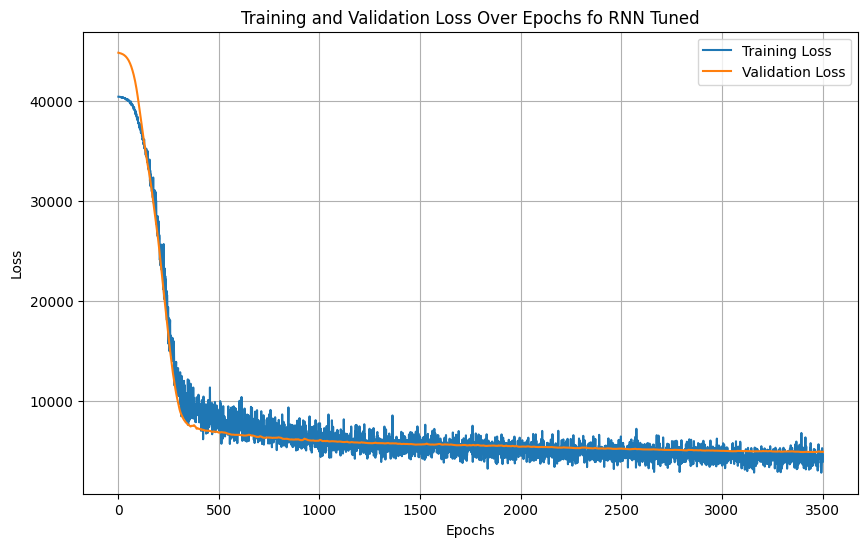

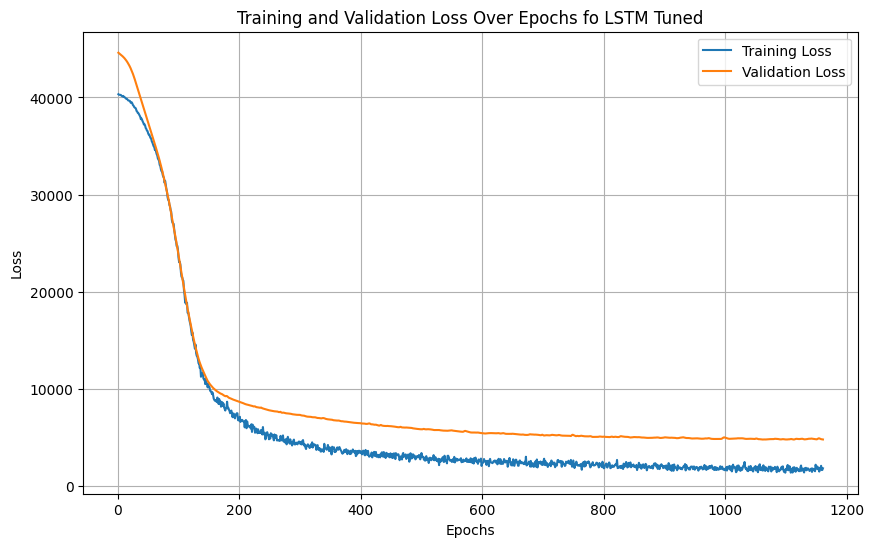

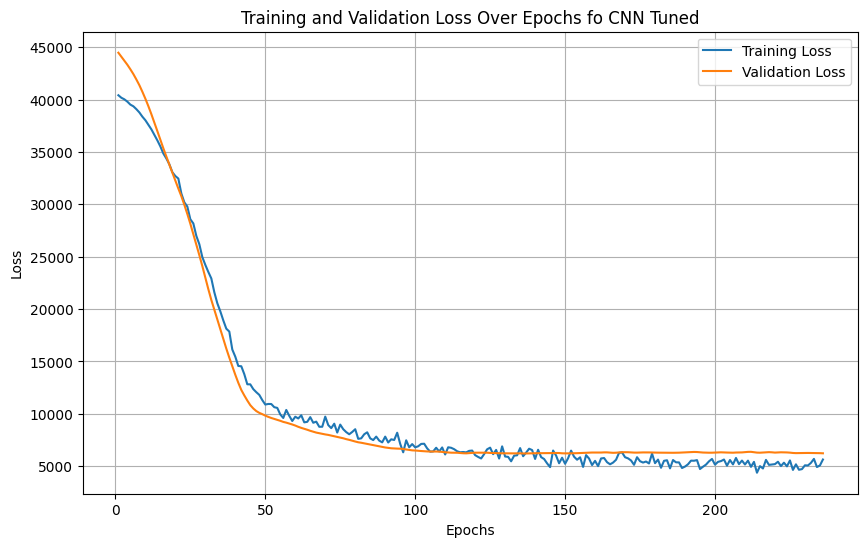

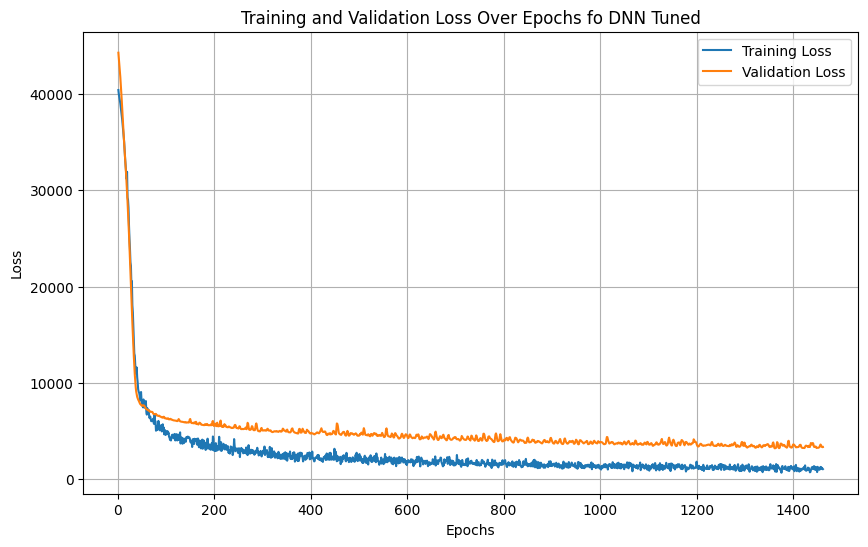

In [183]:
ann_models = [
    'RNN Tuned', 
    'LSTM Tuned', 
    'CNN Tuned',
    'DNN Tuned'
    ]

for i in ann_models:
    # Extract training and validation loss
    train_loss = history_ann_tuned[i].history['loss']
    val_loss = history_ann_tuned[i].history['val_loss']
    epochs = range(1, len(train_loss) + 1)

    # Plot training and validation loss
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title(f'Training and Validation Loss Over Epochs fo {i}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [184]:
# Compare models and choose the best based on RMSE
best_models, best_model_metrics = compare_models(model_ann_tuned_results, 5)

# Print out the best models and their results
print("\nBest Models based on target:")
for model_name, results in best_models.items():
    print(f"{model_name}: {results}")


Top 5 Models Based on Average NRMSE (sorted in ascending order):
  1. Model: ANN (MLP) Tuned, Average NRMSE: 0.2312
  2. Model: DNN Tuned, Average NRMSE: 0.2351
  3. Model: RNN Tuned, Average NRMSE: 0.2509
  4. Model: LSTM Tuned, Average NRMSE: 0.2535
  5. Model: CNN Tuned, Average NRMSE: 0.2554

Top 5 Models Based on Average RMSE (sorted in ascending order):
  1. Model: ANN (MLP) Tuned, Average RMSE: 137.1185
  2. Model: DNN Tuned, Average RMSE: 145.5311
  3. Model: RNN Tuned, Average RMSE: 152.7048
  4. Model: LSTM Tuned, Average RMSE: 153.5858
  5. Model: CNN Tuned, Average RMSE: 154.9375

Top 5 Models Based on Average R2 (sorted in descending order):
  1. Model: ANN (MLP) Tuned, Average R2: 0.428
  2. Model: DNN Tuned, Average R2: 0.3719
  3. Model: RNN Tuned, Average R2: 0.3067
  4. Model: CNN Tuned, Average R2: 0.2955
  5. Model: LSTM Tuned, Average R2: 0.2865

Top 5 Models Based on Average MAE (sorted in ascending order):
  1. Model: ANN (MLP) Tuned, Average MAE: 94.4985
  2. M

# **SYNTHETIC DATA (HIGH COMPUTE)**

## **New Data**

### **SMOTE**

In [186]:
# Find the minimum number of samples in any class in y_train
min_samples = min(y_train.value_counts())  # Get the minimum sample count in the target classes

# Set n_neighbors for SMOTE to be one less than the minimum class size
n_neighbors = min(min_samples-1, 10)  # Ensure n_neighbors is <= min_samples or <= 10

# Initialize SMOTE with reduced k_neighbors
smote = smote = SMOTE(k_neighbors=n_neighbors, random_state=42)  # Set k_neighbors to 2

# Initialize empty lists to store resampled data
X_resampled_list = []
y_resampled_list = []

# Loop over each target variable
for target in y.columns:
    # Fit and transform the training data for each target
    X_resampled, y_resampled = smote.fit_resample(X_train, y_train[target].values.reshape(-1, 1))

    # Append resampled data to lists
    X_resampled_list.append(X_resampled)

    # Convert the resampled y to a DataFrame
    y_resampled_list.append(pd.DataFrame(y_resampled, columns=[target]))

# Combine resampled data back into DataFrames
X_resampled = pd.DataFrame(pd.concat(X_resampled_list, axis=0).values, columns=X.columns)
y_resampled = pd.concat(y_resampled_list, axis=0).reset_index(drop=True)

# Option 1: Fill NaN with the mean of each column
#y_resampled = y_resampled.fillna(y_resampled.mean())
# Option 2: Fill NaN with the median of each column (if the data is skewed)
# y_resampled = y_resampled.fillna(y_resampled.median())

smote_data = pd.concat([X_resampled, y_resampled], axis=1)

### **Bootstrap**

In [187]:
# Number of bootstrap samples to generate
n_bootstrap_samples = 10
bootstrapped_data = []

# Generate multiple bootstrapped datasets
for i in range(n_bootstrap_samples):
    X_resampled, y_resampled = resample(X_train, y_train, replace=True, random_state=i)
    bootstrapped_data.append(pd.concat([X_resampled, y_resampled], axis=1))

# Combine all bootstrapped samples into a single DataFrame
bootstrapped_df = pd.concat(bootstrapped_data, ignore_index=True)

### **Diffusion Neural Network (DNN)**

In [188]:
# Define a simple neural network structure for diffusion
class DiffusionNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(DiffusionNet, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        return self.fc3(x)

# Initialize the network and optimizer
model = DiffusionNet(input_dim=X_train.shape[1], hidden_dim=64, output_dim=y_train.shape[1])
optimizer = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Training the DNN with diffusion approach
X_train_tensor = torch.FloatTensor(X_train.values)
y_train_tensor = torch.FloatTensor(y_train.values)

for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    loss = loss_fn(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()

# Generate synthetic data using trained model
with torch.no_grad():
    synthetic_data = model(X_train_tensor).numpy()

# Convert synthetic data to DataFrame
X_synthetic = pd.DataFrame(X_train, columns=X_train.columns)
y_synthetic = pd.DataFrame(synthetic_data, columns=y_train.columns)

dnn = pd.concat([X_synthetic, y_synthetic], axis=1)
dnn = dnn.dropna(subset=list(dnn.drop(columns=targets)), how='all')

### **Mega Fuzzification and Data Trend Estimation**

In [189]:
# Apply fuzzification for each feature in the dataset
X_fuzzified = []
for column in X_train.columns:
    # Define fuzzy membership functions (e.g., triangular membership)
    x_min, x_max = X_train[column].min(), X_train[column].max()
    memberships = fuzz.trimf(X_train[column].values, [x_min, (x_min + x_max) / 2, x_max])
    X_fuzzified.append(memberships)

# Combine fuzzified features back into DataFrame
X_fuzzified = pd.DataFrame(np.array(X_fuzzified).T, columns=X_train.columns)

# Combine with original target values
fuzzified_data = pd.concat([X_fuzzified, y_train.reset_index(drop=True)], axis=1)

In [190]:
# Define a simple neural network structure for diffusion
class DiffusionNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(DiffusionNet, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        return self.fc3(x)

# Initialize the network and optimizer
model = DiffusionNet(input_dim=X_train.shape[1], hidden_dim=64, output_dim=y_train.shape[1])
optimizer = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Training the DNN with diffusion approach
X_train_tensor = torch.FloatTensor(X_train.values)
y_train_tensor = torch.FloatTensor(y_train.values)

for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    loss = loss_fn(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()

# Generate synthetic data using trained model
with torch.no_grad():
    syn_data = model(X_train_tensor).numpy()

# Convert synthetic data to DataFrame
X_synthetic = pd.DataFrame(X_train, columns=X_train.columns)
y_synthetic = pd.DataFrame(syn_data, columns=y_train.columns)

dnn_data = pd.concat([X_synthetic, y_synthetic], axis=1)


### **Genetic Algorithm (GA)**

In [191]:
# Define the problem as a minimization of distance to actual data points
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)

toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, 0, 1)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_float, n=len(X_train.columns))
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Define evaluation function
def eval_function(individual):
    # Calculate similarity with the data points, e.g., using Euclidean distance
    distance = np.linalg.norm(np.array(individual) - X_train.mean().values)
    return distance,

toolbox.register("evaluate", eval_function)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

# Run the genetic algorithm
population = toolbox.population(n=100)
algorithms.eaSimple(population, toolbox, cxpb=0.5, mutpb=0.2, ngen=50, verbose=False)

# Extract synthetic data from evolved population
synthetic_samples = [ind for ind in population if ind.fitness.values[0] < 1.0]
X_synthetic_ga = pd.DataFrame(synthetic_samples, columns=X_train.columns)
# Create synthetic target data by bootstrapping y_train to match the number of synthetic samples
y_synthetic_ga = y_train.sample(n=X_synthetic_ga.shape[0], replace=True).reset_index(drop=True)

# Combine features and target to create the final synthetic dataset
ga_data = pd.concat([X_synthetic_ga, y_synthetic_ga], axis=1)


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\deap\creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\deap\creator.py:185: RuntimeWarning:

A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.



### **Data Clustering (Fuzzy C-means)**

In [192]:
# Apply fuzzy C-means clustering
cntr, u, _, _, _, _, _ = cluster.cmeans(X_train.T, c=5, m=2, error=0.005, maxiter=1000)

# Generate synthetic feature data from cluster centroids
synthetic_samples = []
for i, centroid in enumerate(cntr):
    samples_around_centroid = centroid + np.random.normal(0, 0.05, size=(10, len(centroid)))  # Generate 10 samples around each centroid
    synthetic_samples.append(samples_around_centroid)

# Combine synthetic feature samples into a DataFrame
X_synthetic_fcm = pd.DataFrame(np.vstack(synthetic_samples), columns=X_train.columns)

# Initialize a list to store synthetic target values
y_synthetic_fcm = []

# Calculate average target value for each cluster and assign to synthetic samples
for i, centroid in enumerate(cntr):
    # Get indices of samples that have the highest membership in this cluster
    cluster_members = np.where(np.argmax(u, axis=0) == i)[0]
    
    # Calculate the average target value for this cluster from original y_train
    avg_target_values = y_train.iloc[cluster_members].mean(axis=0)
    
    # Create synthetic target values for each synthetic sample generated around this centroid
    synthetic_targets_for_cluster = np.tile(avg_target_values.values, (10, 1))  # 10 samples per cluster
    y_synthetic_fcm.append(synthetic_targets_for_cluster)

# Combine all synthetic target values into a DataFrame
y_synthetic_fcm = pd.DataFrame(np.vstack(y_synthetic_fcm), columns=y_train.columns)

# Combine synthetic features and targets into one synthetic dataset
synthetic_data_fcm = pd.concat([X_synthetic_fcm.reset_index(drop=True), y_synthetic_fcm.reset_index(drop=True)], axis=1)


### **Mega Trend Diffusion (MTD)**

In [193]:
# Define skew factor for asymmetry in diffusion boundaries
skew_factor = 1.2  # Adjust based on data characteristics

# Define function to calculate diffusion boundaries
def calculate_boundaries(data, skew_factor=1.2):
    mean_val = np.mean(data)
    std_val = np.std(data)
    lower_bound = mean_val - skew_factor * std_val
    upper_bound = mean_val + skew_factor * std_val
    return lower_bound, upper_bound

# Generate synthetic samples within diffusion boundaries
def generate_mtd_samples(data, num_samples=10, skew_factor=1.2):
    synthetic_samples = []
    for column in data.columns:
        lower, upper = calculate_boundaries(data[column], skew_factor)
        # Generate samples within the calculated range with slight random noise
        samples = np.random.uniform(lower, upper, num_samples) + np.random.normal(0, 0.01, num_samples)
        synthetic_samples.append(samples)
    
    # Convert synthetic samples to DataFrame with same columns as original data
    synthetic_data = pd.DataFrame(np.array(synthetic_samples).T, columns=data.columns)
    return synthetic_data

# Number of synthetic samples to generate per feature
num_synthetic_samples = 300  # Adjust based on need

# Generate synthetic feature samples using MTD
X_synthetic_mtd = generate_mtd_samples(X_train, num_samples=num_synthetic_samples)

# Option 1: Sample target values from y_train to correspond to the synthetic samples
y_synthetic_mtd = y_train.sample(n=num_synthetic_samples, replace=True).reset_index(drop=True)

# Combine synthetic features and synthetic targets
mtd_data = pd.concat([X_synthetic_mtd.reset_index(drop=True), y_synthetic_mtd.reset_index(drop=True)], axis=1)


### **Small Johnson Data Transformation (SJDT)**

In [194]:
# Define function to apply Small Johnson Data Transformation
def apply_sjdt(column):
    mean, std = column.mean(), column.std()
    transformed_data = johnsonsu.rvs(a=mean, b=std, size=len(column))
    return transformed_data

# Apply SJDT to each column in X_train
X_sjdt = X_train.apply(apply_sjdt)

# Combine with target variables
synthetic_data_sjdt = pd.concat([X_sjdt, y_train.reset_index(drop=True)], axis=1)
synthetic_data_sjdt = synthetic_data_sjdt.dropna(subset=list(synthetic_data_sjdt.drop(columns=targets)), how='all')


## **Choose Synthetic Data**

### PREDICT NAN VALUE

In [195]:
synthetic_data = {
    'SMOTE': smote_data,
    'Bootstrap': bootstrapped_df,
    'Diffusion Net' : dnn,
    'MFDTE': fuzzified_data,
    'MTD' : mtd_data,
    'GA' : ga_data,
    'Fuzzy C-Means' : synthetic_data_fcm,
    'SJDT' : synthetic_data_sjdt
    }

synthetic_data['SMOTE & Bootstrap'] = pd.concat([smote_data, bootstrapped_df], ignore_index=True)

dump(synthetic_data, 'synthetic_data.joblib')

['synthetic_data.joblib']

In [196]:
from xgboost import XGBRFRegressor
import numpy as np
import pandas as pd

# Iterate over synthetic datasets
for syndata in synthetic_data:
    selected_synthetic_data = synthetic_data.get(syndata)

    # Iterate over each target variable
    for target in targets:
        # Check for NaN values in the target column
        missing_mask_y = selected_synthetic_data[target].isna()
        
        # Only proceed if there are NaN values in the target column
        if missing_mask_y.any():
            # Prepare training data for the current target variable
            train_data = selected_synthetic_data[~missing_mask_y]  # Rows with non-NaN target values
            X_s_train = train_data.drop(columns=targets)  # Features
            y_s_train = train_data[target]  # Target column to predict

            # Train the model with non-NaN target data
            model = XGBRFRegressor(**remove_estimator__(best_params_xgbrf))  # Initialize model with best params
            model.fit(X_s_train, y_s_train)  # Fit model

            # Prepare data for prediction (rows with NaN in the target column)
            input_data = selected_synthetic_data[missing_mask_y].drop(columns=targets)  # Features with NaN target

            # Predict missing values
            synthetic_predictions = model.predict(input_data)

            # Round predictions to integer values if necessary
            rounded_predictions = np.round(synthetic_predictions).astype(int)

            # Fill NaN values in the target column with predictions
            selected_synthetic_data.loc[missing_mask_y, target] = rounded_predictions
            
    # Ensure no NaN values in the feature columns in train_df before concatenation
    train_df = train_df.dropna(subset=train_df.columns.difference(targets))
    
    # Concatenate train_df and selected_synthetic_data, ignoring index
    selected_synthetic_data = pd.concat([train_df, selected_synthetic_data], ignore_index=True)

    # Display remaining NaN counts for verification
    print(f"NaN counts after filling for {syndata}: \n", selected_synthetic_data.isnull().sum())
    print(f"Size for {syndata}: {selected_synthetic_data.shape} \n")


NaN counts after filling for SMOTE: 
 pH                  0
Depth (m)           0
ODO (mg/L)          0
Cond (µS/cm)        0
Barometer (mmHg)    0
Pressure (psi a)    0
Temp (°F)           0
BABY                0
JUVENILE            0
ADULT               0
dtype: int64
Size for SMOTE: (882, 10) 

NaN counts after filling for Bootstrap: 
 pH                  0
Depth (m)           0
ODO (mg/L)          0
Cond (µS/cm)        0
Barometer (mmHg)    0
Pressure (psi a)    0
Temp (°F)           0
BABY                0
JUVENILE            0
ADULT               0
dtype: int64
Size for Bootstrap: (924, 10) 

NaN counts after filling for Diffusion Net: 
 pH                  0
Depth (m)           0
ODO (mg/L)          0
Cond (µS/cm)        0
Barometer (mmHg)    0
Pressure (psi a)    0
Temp (°F)           0
BABY                0
JUVENILE            0
ADULT               0
dtype: int64
Size for Diffusion Net: (168, 10) 

NaN counts after filling for MFDTE: 
 pH                  0
Depth (m)          

## **Train Ensemble**

In [197]:
syn_model_results = {}
predictions_ens_syn = {}
syn_model_results = {}
for selected_name in synthetic_data:
    selected_synthetic_data = synthetic_data.get(selected_name)
    X_syn_train = selected_synthetic_data.drop(columns=targets)
    y_syn_train = selected_synthetic_data[targets]
    # Dictionary to store model results
    # Define all models
    models = {
        "Random Forest": rf,
        "XGBoost": xg,
        "GBM":  MultiOutputRegressor(gbm),
        "Stacking": stack,
        "Stacking_XGRF": stack_xgrf,
        "XGBRF": xgbrf_model,
        "Decision Tree": dt_model
    }

    # Training and storing results for each model on both datasets
    for model_name, model in models.items():

        print(f"\nTraining {model_name} on {selected_name}...")
        # Train on synthetic dataset
        y_pred_syn, results_syn, history_syn = train(model, X_syn_train, y_syn_train, X_test, y_test)
        syn_model_results[f"{model_name} ({selected_name})"] = results_syn
        predictions_ens_syn[f"{model_name} ({selected_name})"] = y_pred_syn  # Store predictions for synthetic data
        
        
# Save variables to a file
dump(syn_model_results, 'syn_model_results.joblib')
dump(predictions_ens_syn, 'predictions_ens_syn.joblib')


Training Random Forest on SMOTE...
BABY: NRMSE: 0.1234, RMSE: 46.78, R2: 0.8397, MAE: 20.54, MASE: 0.1728
JUVENILE: NRMSE: 0.2208, RMSE: 211.95, R2: 0.5108, MAE: 91.18, MASE: 0.3256
ADULT: NRMSE: 0.2080, RMSE: 84.45, R2: 0.5104, MAE: 34.83, MASE: 0.3126

Training XGBoost on SMOTE...
BABY: NRMSE: 0.1424, RMSE: 53.95, R2: 0.7867, MAE: 43.54, MASE: 0.3662
JUVENILE: NRMSE: 0.1775, RMSE: 170.37, R2: 0.6839, MAE: 95.09, MASE: 0.3396
ADULT: NRMSE: 0.1518, RMSE: 61.62, R2: 0.7393, MAE: 36.84, MASE: 0.3307

Training GBM on SMOTE...
BABY: NRMSE: 0.1112, RMSE: 42.14, R2: 0.8699, MAE: 34.56, MASE: 0.2907
JUVENILE: NRMSE: 0.2007, RMSE: 192.71, R2: 0.5956, MAE: 127.59, MASE: 0.4557
ADULT: NRMSE: 0.1607, RMSE: 65.24, R2: 0.7078, MAE: 38.83, MASE: 0.3486

Training Stacking on SMOTE...
BABY: NRMSE: 0.1274, RMSE: 48.28, R2: 0.8292, MAE: 35.84, MASE: 0.3014
JUVENILE: NRMSE: 0.1819, RMSE: 174.58, R2: 0.6681, MAE: 120.77, MASE: 0.4313
ADULT: NRMSE: 0.1441, RMSE: 58.51, R2: 0.7650, MAE: 37.67, MASE: 0.3382

['predictions_ens_syn.joblib']

In [198]:
# Compare models and choose the best based on RMSE
syn_best_models, syn_best_model_metrics = compare_models(syn_model_results, 10)

# Print out the best models and their results
print("\nBest Models based on target:")
for model_name, results in syn_best_models.items():
    print(f"{model_name}: {results}")


Top 10 Models Based on Average NRMSE (sorted in ascending order):
  1. Model: Stacking (SMOTE), Average NRMSE: 0.1511
  2. Model: GBM (Bootstrap), Average NRMSE: 0.154
  3. Model: Stacking (SMOTE & Bootstrap), Average NRMSE: 0.1566
  4. Model: XGBoost (SMOTE), Average NRMSE: 0.1572
  5. Model: GBM (SMOTE), Average NRMSE: 0.1575
  6. Model: GBM (SMOTE & Bootstrap), Average NRMSE: 0.1577
  7. Model: Stacking (Bootstrap), Average NRMSE: 0.1588
  8. Model: Random Forest (SMOTE & Bootstrap), Average NRMSE: 0.1591
  9. Model: Decision Tree (SMOTE & Bootstrap), Average NRMSE: 0.1628
  10. Model: Random Forest (Bootstrap), Average NRMSE: 0.1631

Top 10 Models Based on Average RMSE (sorted in ascending order):
  1. Model: GBM (Bootstrap), Average RMSE: 91.16
  2. Model: Stacking (SMOTE), Average RMSE: 93.7866
  3. Model: Stacking (SMOTE & Bootstrap), Average RMSE: 93.8698
  4. Model: XGBoost (SMOTE), Average RMSE: 95.3165
  5. Model: GBM (SMOTE & Bootstrap), Average RMSE: 96.7438
  6. Model: R

## **Train ANN**

In [199]:
# Define all models
models = {
    "ANN (MLP)": tuned_ann_models.get('MLP'),
    "RNN": tuned_ann_models.get('RNN'),
    "LSTM": tuned_ann_models.get('LSTM'),
    "CNN": tuned_ann_models.get('CNN'),
    "DNN": tuned_ann_models.get('DNN'),
}

X_syn_train = synthetic_data.get('Bootstrap').drop(columns=targets)
y_syn_train = synthetic_data.get('Bootstrap')[targets]

history_ann_syn = {}
predictions_ann_syn = {}
model_ann_syn_results = {}
X_train_rnn = reshape_for_rnn_cnn(X_syn_train, model_type="rnn")
X_test_rnn = reshape_for_rnn_cnn(X_test, model_type="rnn")
X_train_cnn = reshape_for_rnn_cnn(X_syn_train, model_type="cnn")
X_test_cnn = reshape_for_rnn_cnn(X_test, model_type="cnn")


patience=100
epochs = 5000
# Training and storing results for each model
for model_name, _ in models.items():
  if model_name == 'ANN (MLP)':
    # Get the parameters from the trained model
    model_params = tuned_ann_models.get('MLP').get_params()
    # Re-initialize a new MLP model with the same parameters
    model = MLPRegressor(**model_params)
  else:
    # Get the model configuration from the trained model
    model_config = tuned_ann_models.get(model_name).get_config()
    # Re-initialize the model with the same configuration
    model = Sequential.from_config(model_config)
    # Recompile the model (optional but recommended if you plan to train again)
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
  
  print(f"\nTraining {model_name}...")
  m_name = f'{model_name} SynData'
  # Handle RNN, LSTM, CNN models that need reshaped input
  if model_name in ["RNN", "LSTM"]:
    predictions_ann_syn[m_name], model_ann_syn_results[m_name], history_ann_syn[m_name] = train(model,
                                                                                       X_train_rnn, y_syn_train, X_test_rnn, y_test,
                                                                                       model_name = model_name, 
                                                                                       patience=patience, 
                                                                                       epochs=epochs,
                                                                                       earlystop= True
                                                                                       )
  elif model_name in ["CNN"]:
    predictions_ann_syn[m_name], model_ann_syn_results[m_name], history_ann_syn[m_name] = train(model, 
                                                                                       X_train_cnn, y_syn_train, X_test_cnn, y_test, 
                                                                                       model_name = model_name, 
                                                                                       patience=patience, 
                                                                                       epochs=epochs,
                                                                                       earlystop= True
                                                                                       )
  else:
    try:
      predictions_ann_syn[m_name], model_ann_syn_results[m_name], history_ann_syn[m_name] = train(model, 
                                                                                         X_syn_train, y_syn_train, X_test, y_test, 
                                                                                         model_name = model_name, 
                                                                                         patience=patience, 
                                                                                         epochs=epochs,
                                                                                         earlystop= True
                                                                                         )
    except:
      predictions_ann_syn[m_name], model_ann_syn_results[m_name], history_ann_syn[m_name] = train(MultiOutputRegressor(model), 
                                                                                         X_syn_train, y_syn_train, X_test, y_test, 
                                                                                         model_name = model_name, 
                                                                                         patience=patience, 
                                                                                         epochs=epochs,
                                                                                         earlystop= True
                                                                                         )
# Save variables to a file
dump(predictions_ann_syn, 'predictions_ann_syn.joblib')
dump(model_ann_syn_results, 'model_ann_syn_results.joblib')


Training ANN (MLP)...
BABY: NRMSE: 0.1848, RMSE: 70.02, R2: 0.6407, MAE: 57.97, MASE: 0.4875
JUVENILE: NRMSE: 0.2295, RMSE: 220.28, R2: 0.4716, MAE: 157.04, MASE: 0.5608
ADULT: NRMSE: 0.2100, RMSE: 85.26, R2: 0.5009, MAE: 57.66, MASE: 0.5176

Training RNN...
Epoch 1/5000
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 40199.0898 - mae: 166.3575 - val_loss: 44799.9102 - val_mae: 176.5427
Epoch 2/5000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 41896.8516 - mae: 166.8280 - val_loss: 44688.5195 - val_mae: 176.2664
Epoch 3/5000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 41744.1094 - mae: 168.1904 - val_loss: 44528.1562 - val_mae: 175.8723
Epoch 4/5000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 38557.1016 - mae: 159.6982 - val_loss: 44303.2734 - val_mae: 175.3184
Epoch 5/5000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 43590.2266 - mae: 170.0539 - val_loss: 43994.6758 - val_mae: 174.5556
Epoch 6/5000
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 39930.6523 - mae: 160.8979 - 

['model_ann_syn_results.joblib']

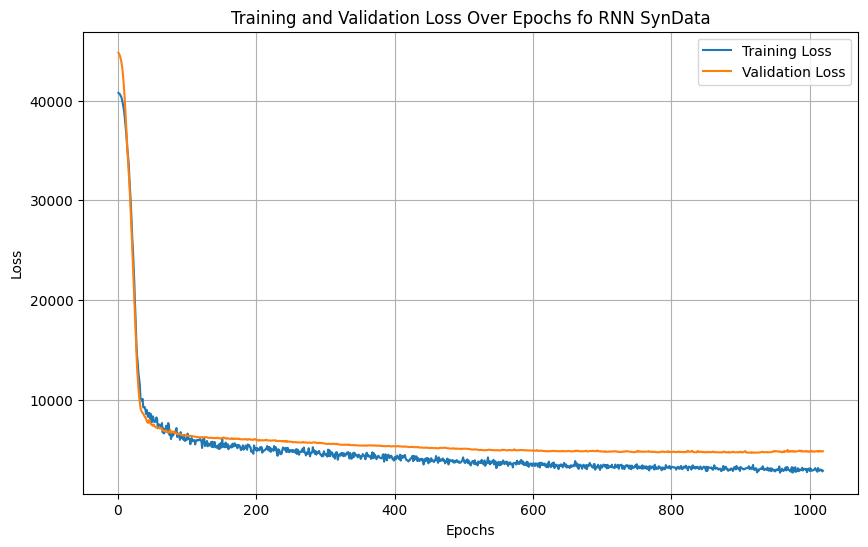

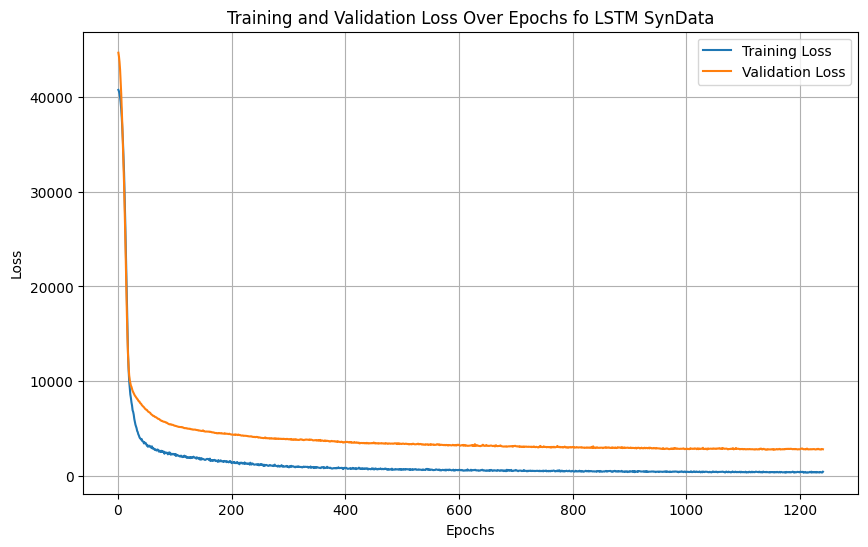

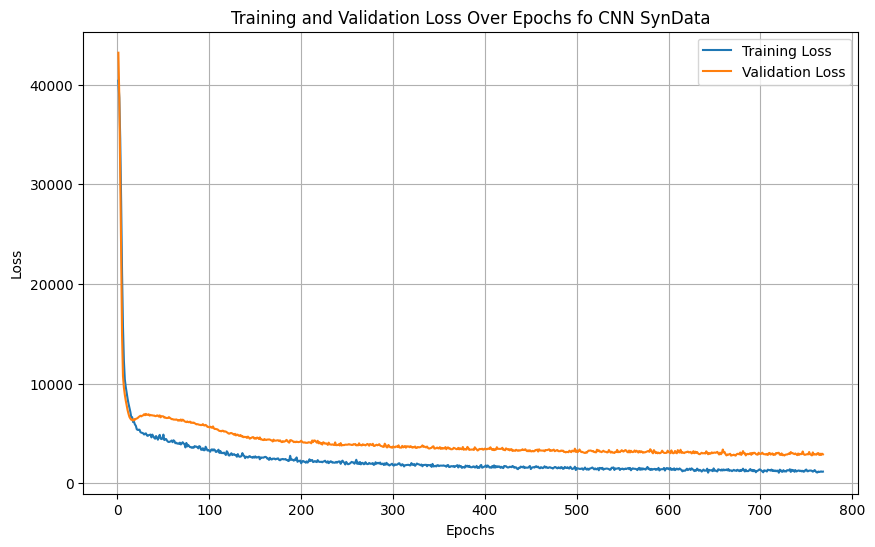

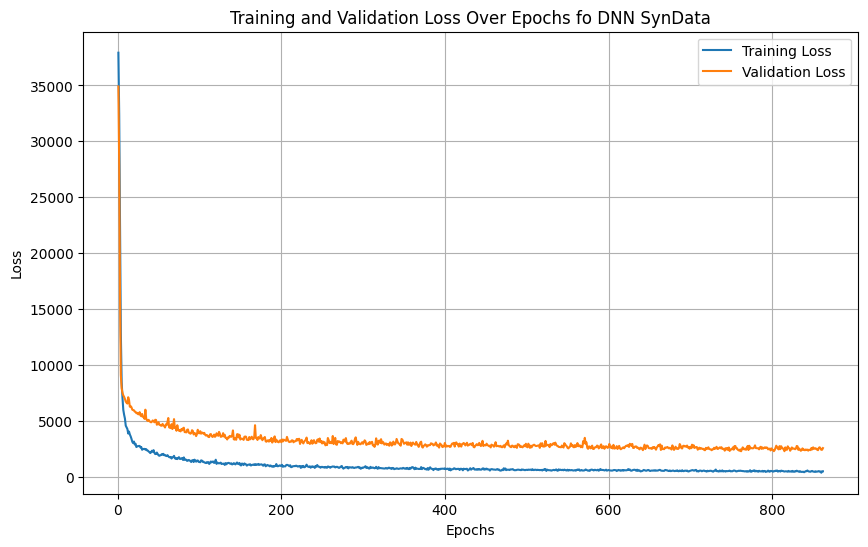

In [200]:
ann_models = [
    'RNN SynData', 
    'LSTM SynData', 
    'CNN SynData',
    'DNN SynData'
    ]

for i in ann_models:
    # Extract training and validation loss
    train_loss = history_ann_syn[i].history['loss']
    val_loss = history_ann_syn[i].history['val_loss']
    epochs = range(1, len(train_loss) + 1)

    # Plot training and validation loss
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title(f'Training and Validation Loss Over Epochs fo {i}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [201]:
# Compare models and choose the best based on RMSE
best_models, best_model_metrics = compare_models(model_ann_syn_results, 5)

# Print out the best models and their results
print("\nBest Models based on target:")
for model_name, results in best_models.items():
    print(f"{model_name}: {results}")


Top 5 Models Based on Average NRMSE (sorted in ascending order):
  1. Model: ANN (MLP) SynData, Average NRMSE: 0.2081
  2. Model: DNN SynData, Average NRMSE: 0.2178
  3. Model: LSTM SynData, Average NRMSE: 0.2313
  4. Model: CNN SynData, Average NRMSE: 0.2364
  5. Model: RNN SynData, Average NRMSE: 0.2519

Top 5 Models Based on Average RMSE (sorted in ascending order):
  1. Model: ANN (MLP) SynData, Average RMSE: 125.1877
  2. Model: DNN SynData, Average RMSE: 137.444
  3. Model: LSTM SynData, Average RMSE: 143.8772
  4. Model: CNN SynData, Average RMSE: 146.1934
  5. Model: RNN SynData, Average RMSE: 153.4711

Top 5 Models Based on Average R2 (sorted in descending order):
  1. Model: ANN (MLP) SynData, Average R2: 0.5377
  2. Model: DNN SynData, Average R2: 0.4505
  3. Model: LSTM SynData, Average R2: 0.3828
  4. Model: CNN SynData, Average R2: 0.3514
  5. Model: RNN SynData, Average R2: 0.2969

Top 5 Models Based on Average MAE (sorted in ascending order):
  1. Model: ANN (MLP) SynD

# **RESULTS**

## BarChart

In [202]:
combined_tuned = {**tuned_model_results, **model_ann_tuned_results}
combined_syn = {**syn_model_results, **model_ann_syn_results}
combined_results = {**syn_model_results, **combined_tuned, **combined_syn}
dump(combined_results, 'combined_results.joblib')
dump(combined_tuned, 'combined_tuned.joblib')
dump(combined_syn, 'combined_syn.joblib')

['combined_syn.joblib']

In [215]:
list_results = {
        'Best Initial Model': model_results,
        'Best Ensemble Model': ens_model_results,
        'Best Tuned Model': combined_tuned,
        'Best Model with SynData': combined_syn,
        'SynData vs Tuned': combined_results,
    }
bar_vis(list_results)

dump(list_results, 'list_results.joblib')

['list_results.joblib']

## Regression

In [204]:
# Create checkboxes for each model in models_list
models_list = combined_results.keys()
all_predictions = {}
predictions = [predictions_initial, predictions_tuned_ens, predictions_ann_tuned, predictions_ens_syn, predictions_ann_syn]
for i in range(len(predictions)):
    all_predictions.update(predictions[i])

Visualizing results for: ['Random Forest (SMOTE)', 'XGBoost (SMOTE)', 'GBM (SMOTE)', 'Stacking (SMOTE)', 'Stacking_XGRF (SMOTE)', 'XGBRF (SMOTE)', 'Decision Tree (SMOTE)', 'Random Forest (Bootstrap)', 'XGBoost (Bootstrap)', 'GBM (Bootstrap)', 'Stacking (Bootstrap)', 'Stacking_XGRF (Bootstrap)', 'XGBRF (Bootstrap)', 'Decision Tree (Bootstrap)', 'Random Forest (Diffusion Net)', 'XGBoost (Diffusion Net)', 'GBM (Diffusion Net)', 'Stacking (Diffusion Net)', 'Stacking_XGRF (Diffusion Net)', 'XGBRF (Diffusion Net)', 'Decision Tree (Diffusion Net)', 'Random Forest (MFDTE)', 'XGBoost (MFDTE)', 'GBM (MFDTE)', 'Stacking (MFDTE)', 'Stacking_XGRF (MFDTE)', 'XGBRF (MFDTE)', 'Decision Tree (MFDTE)', 'Random Forest (MTD)', 'XGBoost (MTD)', 'GBM (MTD)', 'Stacking (MTD)', 'Stacking_XGRF (MTD)', 'XGBRF (MTD)', 'Decision Tree (MTD)', 'Random Forest (GA)', 'XGBoost (GA)', 'GBM (GA)', 'Stacking (GA)', 'Stacking_XGRF (GA)', 'XGBRF (GA)', 'Decision Tree (GA)', 'Random Forest (Fuzzy C-Means)', 'XGBoost (Fuzzy 

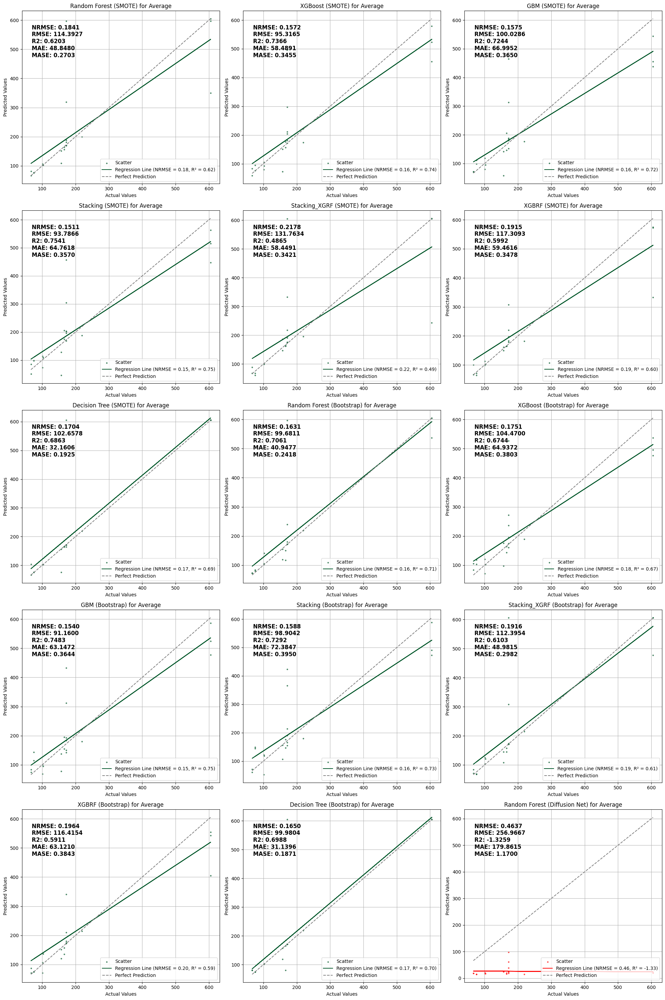

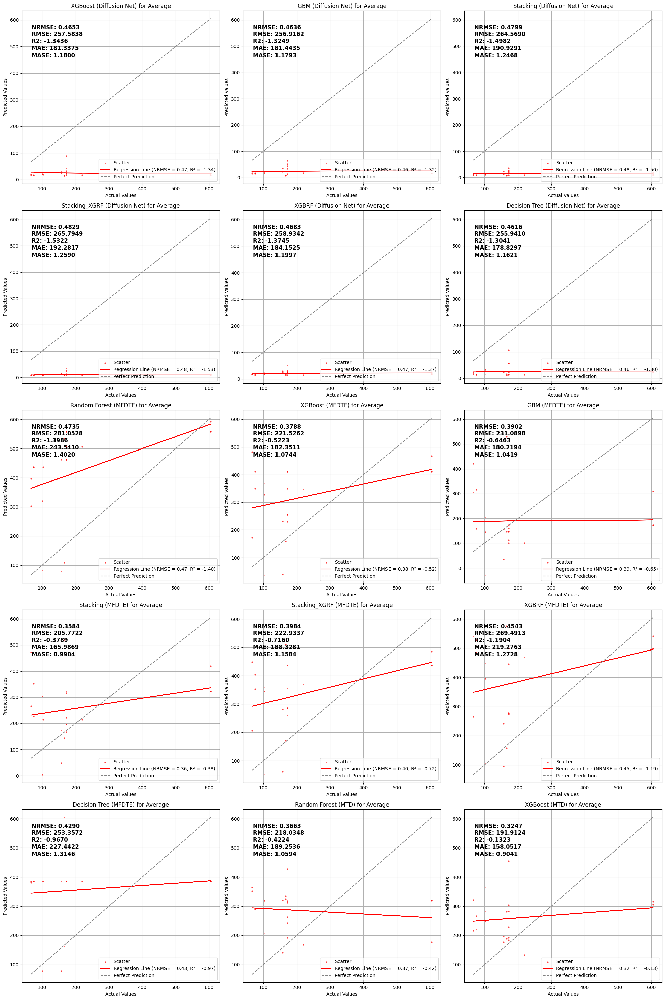

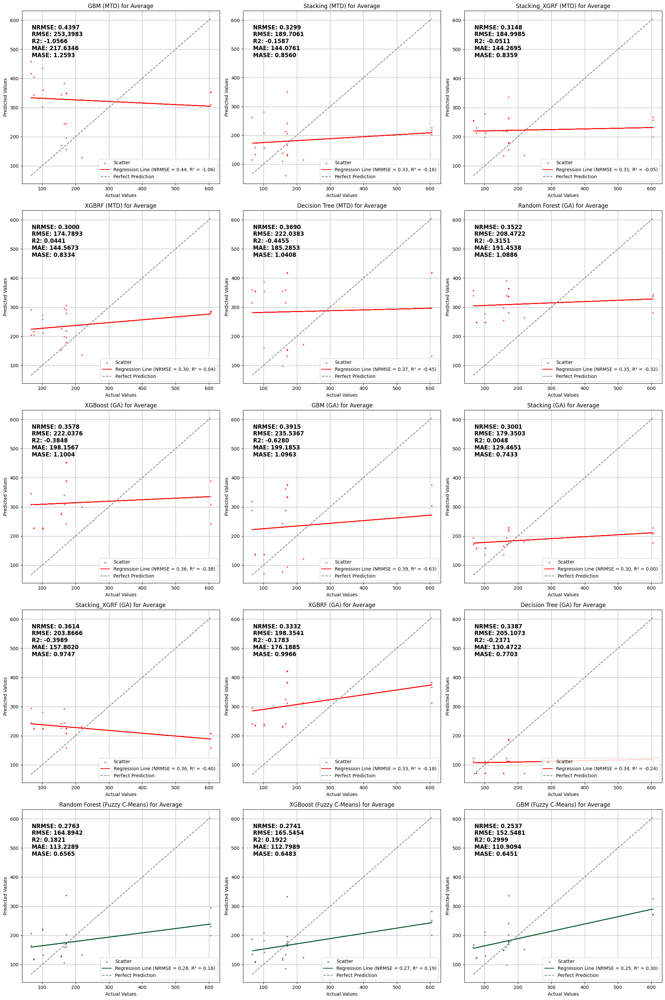

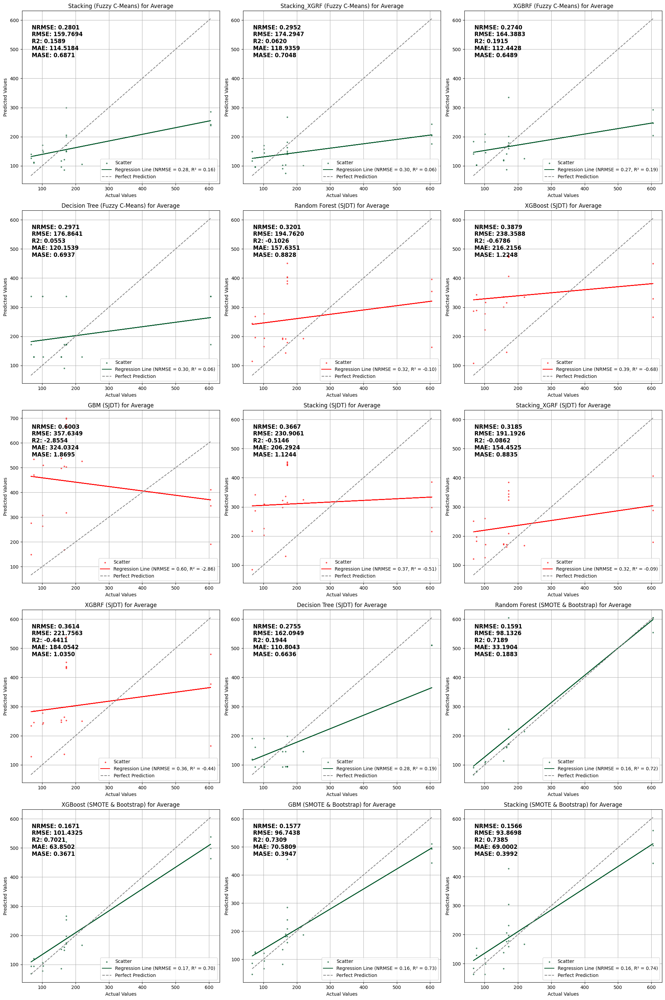

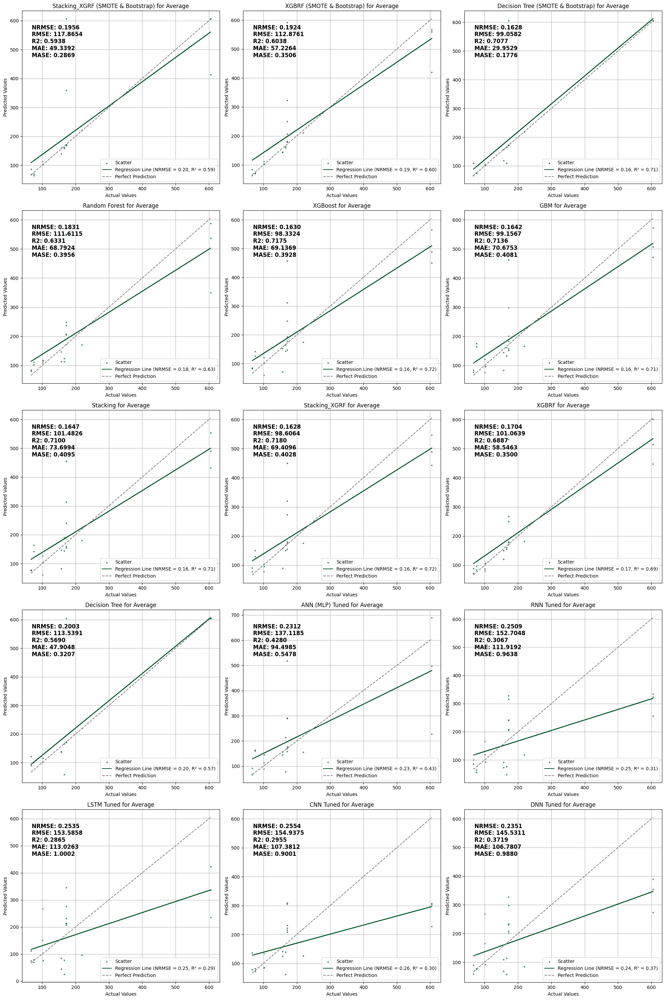

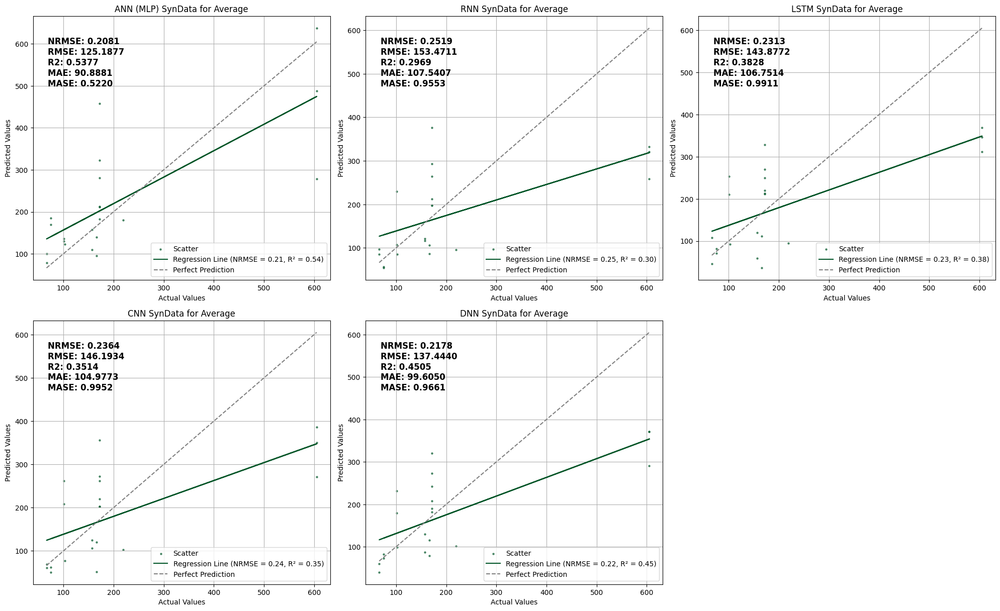

In [ ]:
filter_reg(models_list, y_test, all_predictions, combined_results)
dump(all_predictions, 'all_predictions.joblib')
dump(combined_results, 'combined_results.joblib')

# **Export Best Model**

In [235]:
scaler = RobustScaler()

scaled_state_df = df.copy()
columns_to_scale = df_reduced.columns
scaled_state_df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

dump(scaler, 'robust_scaler.joblib')
dump(targets, 'targets.joblib')

['targets.joblib']

In [236]:
best_trained_model = stack.fit(X_syn_train, y_syn_train)
dump(best_trained_model, 'best_trained_model.joblib')


['best_trained_model.joblib']

# **Load Variables**

In [ ]:
# Load variables from a file
targets = load('targets.joblib')
all_selected_features = load('all_selected_features.joblib')
best_nrmse = load('best_nrmse.joblib')
best_feature_set = load('best_feature_set.joblib')
best_vote_threshold = load('best_vote_threshold.joblib')
df_reduced = load('df_reduced.joblib')
removed_features = load('removed_features.joblib')
X_train = load('X_train.joblib')
y_train = load('y_train.joblib')
X_test= load('X_test.joblib')
y_test = load('y_test.joblib')
train_df = load('train_df.joblib')
model_results = load('model_results.joblib')
predictions_initial = load('predictions_initial.joblib')
ens_model_results = load('ens_model_results.joblib')
best_params_xg = load('best_params_xg.joblib')
best_params_rf = load('best_params_rf.joblib')
best_params_gbm = load('best_params_gbm.joblib')
best_params_dt = load('best_params_dt.joblib')
best_params_xgbrf = load('best_params_xgbrf.joblib')
results_df = load('results_df.joblib')
best_results_xgrf = load('best_results_xgrf.joblib')
best_params_stack = load('best_params_stack.joblib')
best_params_stack_xgrf = load('best_params_stack_xgrf.joblib')
tuned_model_results = load('tuned_model_results.joblib')
predictions_tuned_ens = load('predictions_tuned_ens.joblib')
synthetic_data = load('synthetic_data.joblib')
predictions_ann_tuned = load('predictions_ann_tuned.joblib')
model_ann_tuned_results = load('model_ann_tuned_results.joblib')
syn_model_results = load('syn_model_results.joblib')
predictions_ens_syn = load('predictions_ens_syn.joblib')
predictions_ann_syn = load('predictions_ann_syn.joblib')
model_ann_syn_results = load('model_ann_syn_results.joblib')
combined_results = load('combined_results.joblib')
combined_tuned = load('combined_tuned.joblib')
combined_syn = load('combined_syn.joblib')
all_predictions = load('all_predictions.joblib')
list_results = load('list_results.joblib')
best_trained_model = load('best_trained_model.joblib')